# ESPosition Evaluation

In [1]:
from common import *

## Prepare the data

In [6]:
# Define input and output base directories
input_base = "./data/original"
output_base = "./data/filtered"

# Regular expression to match and strip date prefixes
date_pattern = r"^\d{4}_\d{2}_\d{2}_\d{2}_\d{2}_\d{2}_"

def replace_macs(df):
    mac_replacements = {
        "f6049f6df5e6": "20f094118214"
    }
    columns = ["monitor_mac", "target_mac"]
    for col in columns:
        df[col] = df[col].replace(mac_replacements)

    return df

def filter_target_macs(df):
    return df[df["target_mac"].isin(target_macs)]

# Walk through each subfolder in the input directory
for subfolder in os.listdir(input_base):
    input_folder = os.path.join(input_base, subfolder)
    
    # Ensure it's a directory
    if os.path.isdir(input_folder):
        output_folder = os.path.join(output_base, subfolder)
        
        # Create the output subfolder if it doesn't exist
        os.makedirs(output_folder, exist_ok=True)
        
        # Process all CSV files in the current subfolder
        for filename in os.listdir(input_folder):
            if filename.endswith(".csv"):
                input_file_path = os.path.join(input_folder, filename)
                print(f"Processing: {input_file_path}")
                
                # Read the CSV file
                df = pd.read_csv(input_file_path)

                df = replace_macs(df)
                df = filter_target_macs(df)
                
                # Remove the date prefix from the filename
                cleaned_filename = re.sub(date_pattern, "", filename)
                
                # Define the output file path
                output_file_path = os.path.join(output_folder, cleaned_filename)
                
                # Save the processed file
                df.to_csv(output_file_path, index=False)
                print(f"Saved: {output_file_path}")

print("Processing complete.")

Processing: ./data/original\apb\2024_12_11_12_48_56_Pixel9.csv
Saved: ./data/filtered\apb\Pixel9.csv
Processing: ./data/original\apb\2024_12_12_10_17_51_iPhone.csv
Saved: ./data/filtered\apb\iPhone.csv
Processing: ./data/original\apb\2024_12_12_10_43_30_P20_Pro.csv
Saved: ./data/filtered\apb\P20_Pro.csv
Processing: ./data/original\apb\2024_12_12_11_31_48_Pixel9_eval.csv
Saved: ./data/filtered\apb\Pixel9_eval.csv
Processing: ./data/original\apb\2024_12_12_11_54_13_iPhone_eval.csv
Saved: ./data/filtered\apb\iPhone_eval.csv
Processing: ./data/original\apb\2024_12_12_12_20_42_P20_Pro_eval.csv
Saved: ./data/filtered\apb\P20_Pro_eval.csv
Processing: ./data/original\apb\2024_12_12_13_04_53_Pixel9_path_youtube.csv
Saved: ./data/filtered\apb\Pixel9_path_youtube.csv
Processing: ./data/original\apb\2024_12_12_13_08_00_Pixel9_path_spotify.csv
Saved: ./data/filtered\apb\Pixel9_path_spotify.csv
Processing: ./data/original\apb\2024_12_12_13_12_20_Pixel9_path_standby.csv
Saved: ./data/filtered\apb\Pix

In [2]:
def get_unique_points_(file_path, x_col, y_col, filter_col=None):
    # Load the CSV file
    df = pd.read_csv(file_path)

    # Extract the distinct points as a set of tuples
    if filter_col is not None:
        distinct_df = df[[filter_col, x_col, y_col]]
    else:
        distinct_df = df[[x_col, y_col]]

    distinct_df = distinct_df.drop_duplicates()
    
    # Sort by y coordinate, then by x coordinate
    sorted_df = distinct_df.sort_values(by=[y_col, x_col]).reset_index(drop=True)
    
    # Print all distinct points
    return sorted_df

In [3]:
def find_mean_target_position(dfs):
    # Calculate pairwise distances and find matching indices
    def find_closest_indices(df_ref, df_other):
        distances = np.sqrt(
            (df_ref['target_position_x'].values - df_other['target_position_x'].values[:, None]) ** 2 +
            (df_ref['target_position_y'].values - df_other['target_position_y'].values[:, None]) ** 2
        )
        return np.argmin(distances, axis=0)

    dfs_sorted = [df.iloc[find_closest_indices(dfs[0], df)].reset_index(drop=True) for df in dfs]

    dfs_x = [df['target_position_x'] for df in dfs_sorted]
    dfs_y = [df['target_position_y'] for df in dfs_sorted]

    df_mean_x = pd.concat(dfs_x, axis=1).mean(axis=1).round().astype(int)
    df_mean_y = pd.concat(dfs_y, axis=1).mean(axis=1).round().astype(int)

    for df in dfs_sorted:
        df['target_position_mean_x'] = df_mean_x
        df['target_position_mean_y'] = df_mean_y

    return dfs_sorted

In [4]:
def cluster_target_positions(filepaths):
    target_positions = [get_unique_points_(filepath, "target_position_x", "target_position_y") for filepath in filepaths]
    mean_target_positions = find_mean_target_position(target_positions)

    for filepath, mean_target_position in zip(filepaths, mean_target_positions):
        df = pd.read_csv(filepath)
        df['target_position_x'] = df['target_position_x'].replace(mean_target_position['target_position_x'].to_list(), mean_target_position['target_position_mean_x'].to_list()).astype(int)
        df['target_position_y'] = df['target_position_y'].replace(mean_target_position['target_position_y'].to_list(), mean_target_position['target_position_mean_y'].to_list()).astype(int)
        df.to_csv(filepath, index=False)

In [10]:
cluster_target_positions(["./data/filtered/flat/Pixel9.csv", "./data/filtered/flat/P20_Pro.csv", "./data/filtered/flat/iPhone.csv"])
cluster_target_positions(["./data/filtered/flat/Pixel9_eval.csv", "./data/filtered/flat/P20_Pro_eval.csv", "./data/filtered/flat/iPhone_eval.csv"])

## General Information

In [5]:
print("All Anchor Positions:\n")
get_unique_points_("./data/filtered/flat/Pixel9.csv", "anchor_position_x", "anchor_position_y", "monitor_mac")

All Anchor Positions:



,monitor_mac,anchor_position_x,anchor_position_y
0,f8b3b732fb6c,62,42
1,483fda467e7a,62,42
2,08a6f7a1e5c8,270,387
3,d8bfc0117c7d,556,510
4,a0a3b3ff66b4,556,510
5,a4cf12fdaea9,56,723
6,f8b3b73303e8,56,723
7,24a1602ccfab,744,844
8,a0a3b3ff35c0,744,844
9,f8b3b734347c,441,934


In [6]:
print("All Fingerprint Positions:\n")
get_unique_points_("./data/filtered/flat/Pixel9.csv", "target_position_x", "target_position_y")

All Fingerprint Positions:



,target_position_x,target_position_y
0,133,112
1,282,112
2,430,112
3,282,262
4,431,262
5,133,263
6,132,410
7,282,410
8,433,414
9,355,544


## RSSI over Time

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Enable inline plotting in Jupyter Lab
%matplotlib inline

def euclidean_distance(x1, y1, x2, y2):
    """Calculate the Euclidean distance between two points (x1, y1) and (x2, y2)."""
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2) / 100

def plot_rssi_over_time(csv_file, monitor_mac_col="monitor_mac", timestamp_col="timestamp", rssi_col="rssi", target_position_x_col="target_position_x", target_position_y_col="target_position_y", anchor_position_x_col="anchor_position_x", anchor_position_y_col="anchor_position_y"):
    # Load the CSV file
    df = pd.read_csv(csv_file)
    
    # Check if required columns exist
    for col in [monitor_mac_col, timestamp_col, rssi_col]:
        if col not in df.columns:
            raise ValueError(f"Error: Column '{col}' not found in the CSV file.")

    # Get unique target positions (combinations of x and y coordinates)
    target_positions = df[[target_position_x_col, target_position_y_col]].drop_duplicates()

    # Get unique anchor positions (combinations of x and y coordinates)
    anchor_positions = df[[monitor_mac_col, anchor_position_x_col, anchor_position_y_col]].drop_duplicates()

    # Get unique monitor MAC addresses (assumed there are 10 nodes)
    monitor_macs = df[monitor_mac_col].unique()

    # Iterate over each target location and create a separate figure
    for target_index, (x, y) in target_positions.iterrows():
        target_data = df[(df[target_position_x_col] == x) & (df[target_position_y_col] == y)]
        
        # Create a new figure for each target location
        plt.figure(figsize=(15, 10))
        
        # Plot RSSI for each monitor node at the current target location
        for i, monitor_mac in enumerate(monitor_macs[:10]):  # Assuming 10 monitor nodes
            plt.subplot(5, 2, i + 1)  # 2 rows, 5 columns for the subplots
            
            node_data = target_data[target_data[monitor_mac_col] == monitor_mac].copy()

            # Subtract the minimum timestamp to start from 0 for plotting
            node_data[timestamp_col] = node_data[timestamp_col] - node_data[timestamp_col].min()
            
            # Plot the RSSI values over time for the current monitor node at the current target location
            plt.plot(node_data[timestamp_col], node_data[rssi_col], label=f'Monitor {monitor_mac}')

            # Calculate the Euclidean distance between the target and each anchor
            anchor_position = anchor_positions[anchor_positions[monitor_mac_col] == monitor_mac].iloc[0]
            (ax, ay) = (float(anchor_position[anchor_position_x_col]), float(anchor_position[anchor_position_y_col]))
            distance = euclidean_distance(x, y, ax, ay)
            
            # Add the Euclidean distance to the plot label
            plt.title(f'RSSI - {monitor_mac}\nDistance: {distance:.2f} m')
            plt.xlabel('Time (seconds)')
            plt.ylabel('RSSI')
            plt.tight_layout()
        
        # Show the plot for the current target location
        plt.suptitle(f'RSSI over Time for Target Location ({x}, {y})', fontsize=16)
        plt.show()

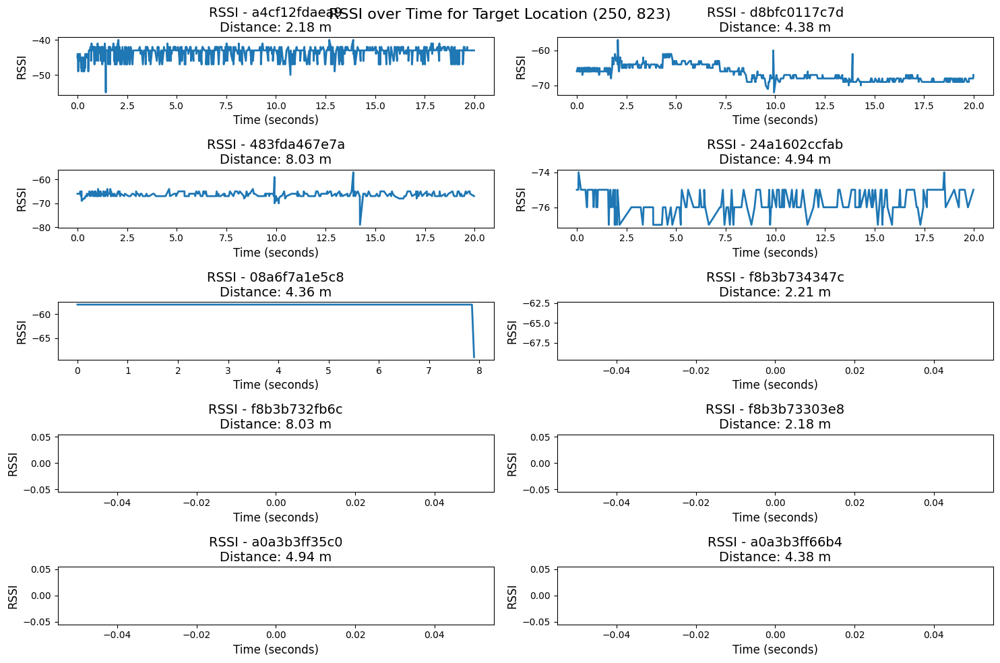

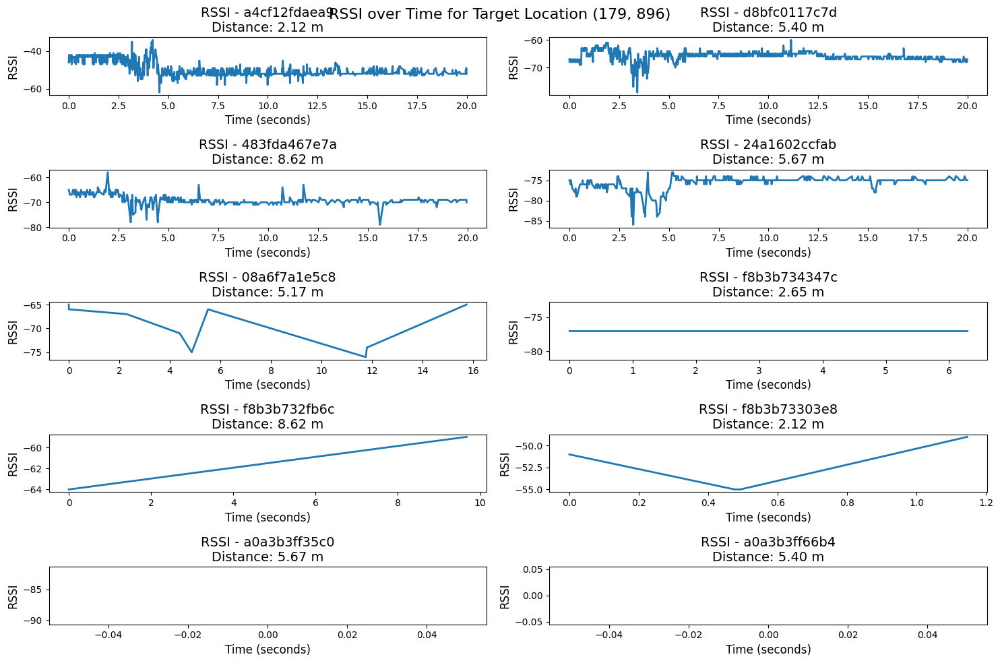

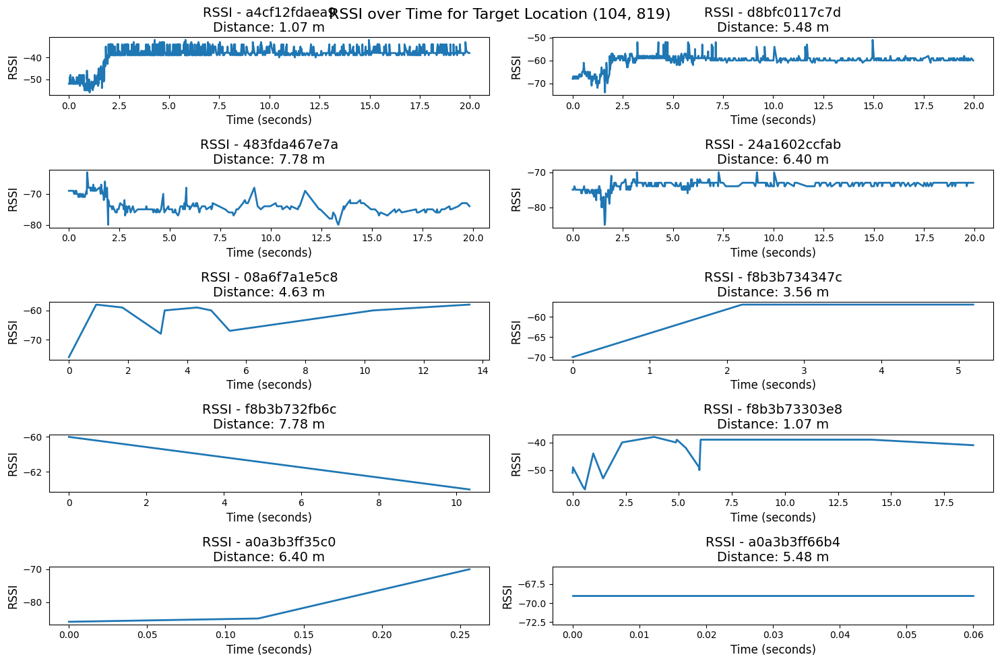

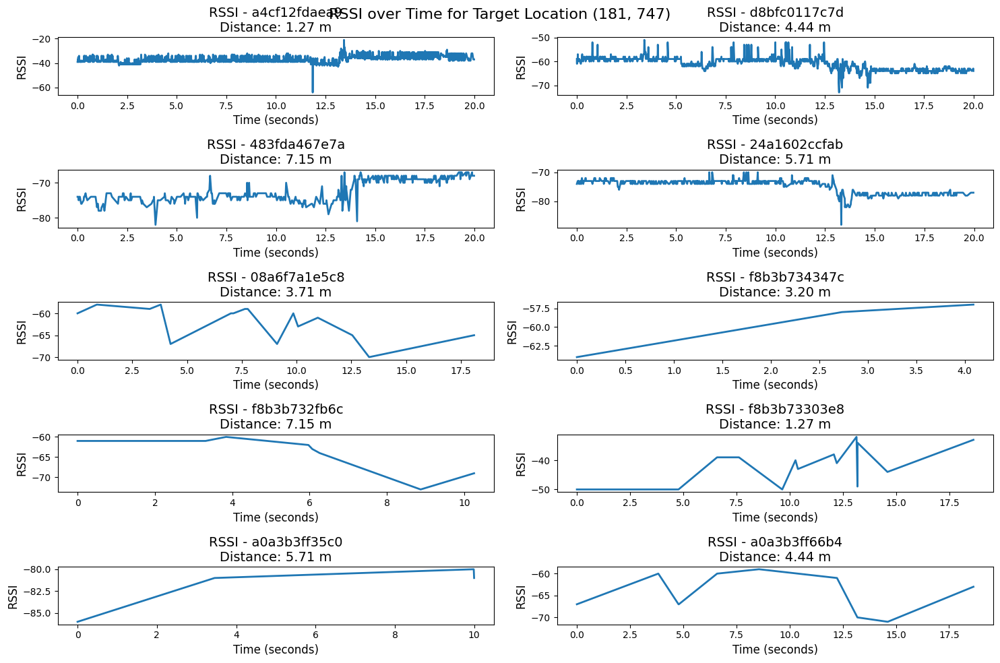

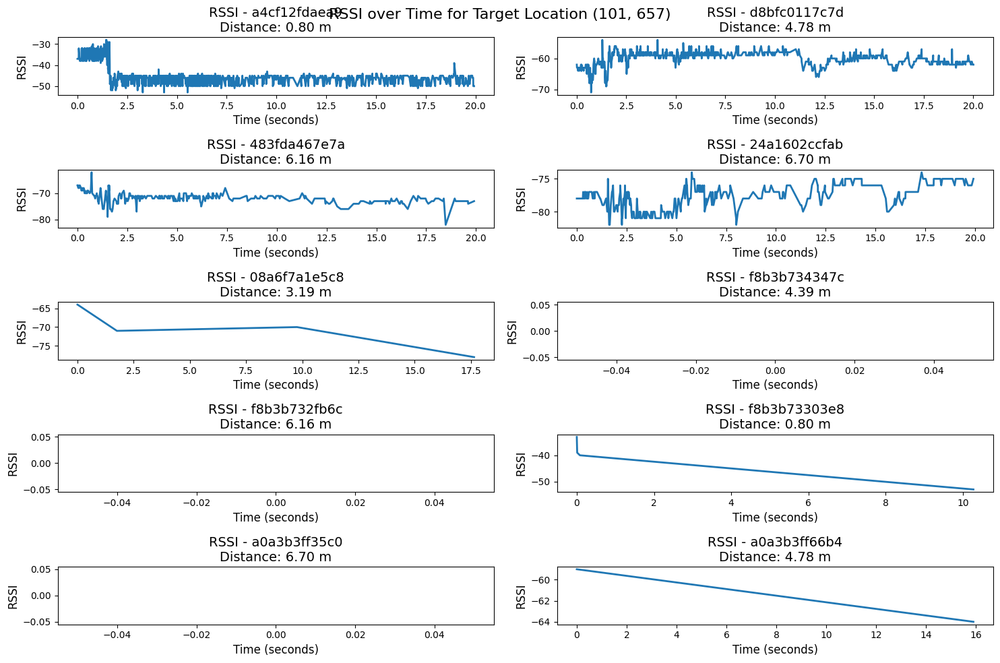

...

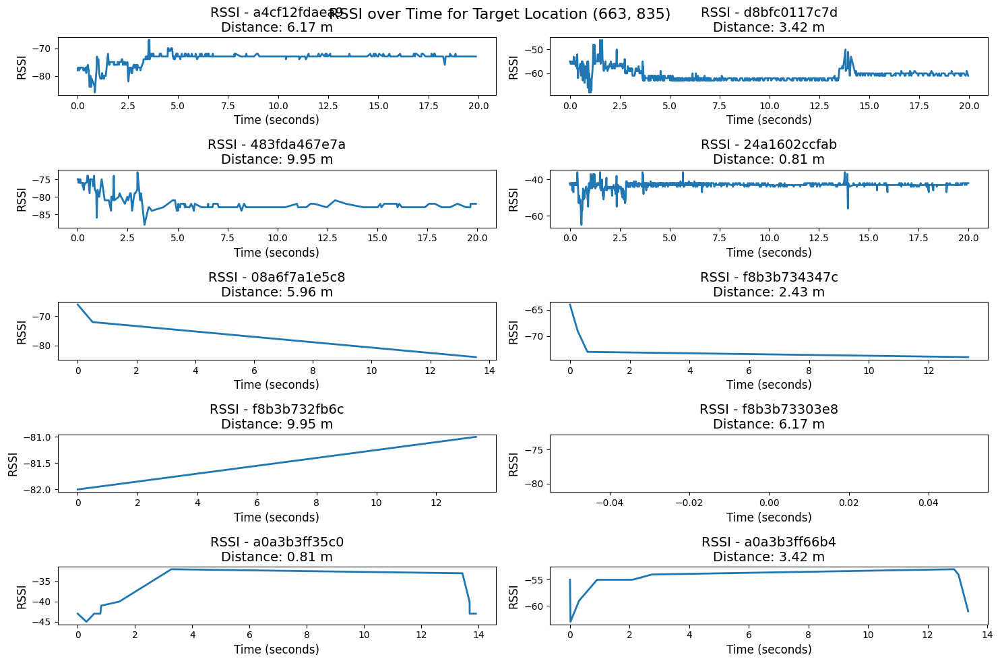

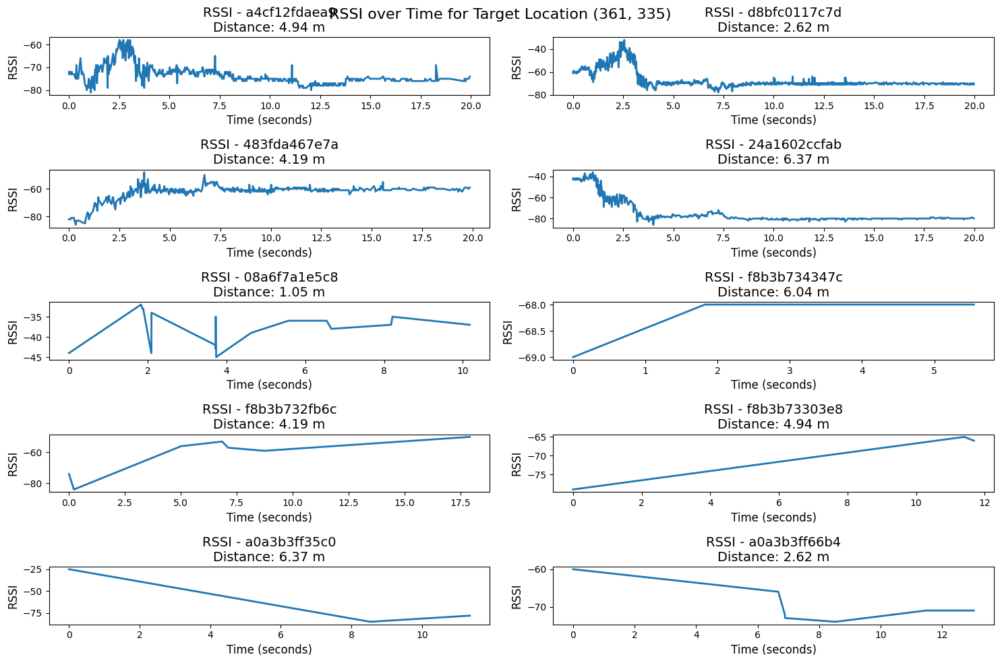

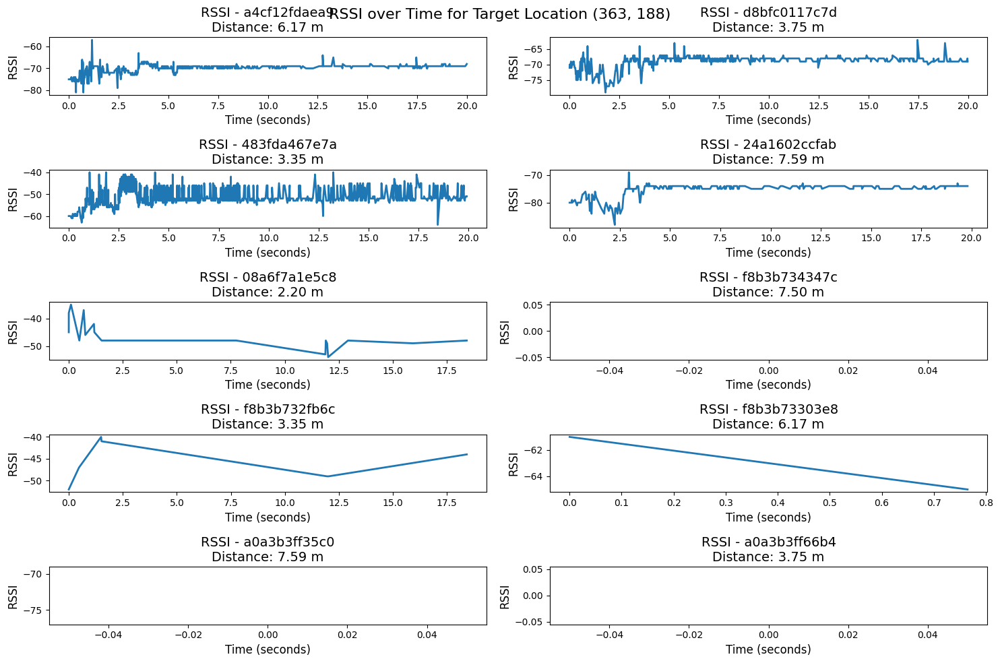

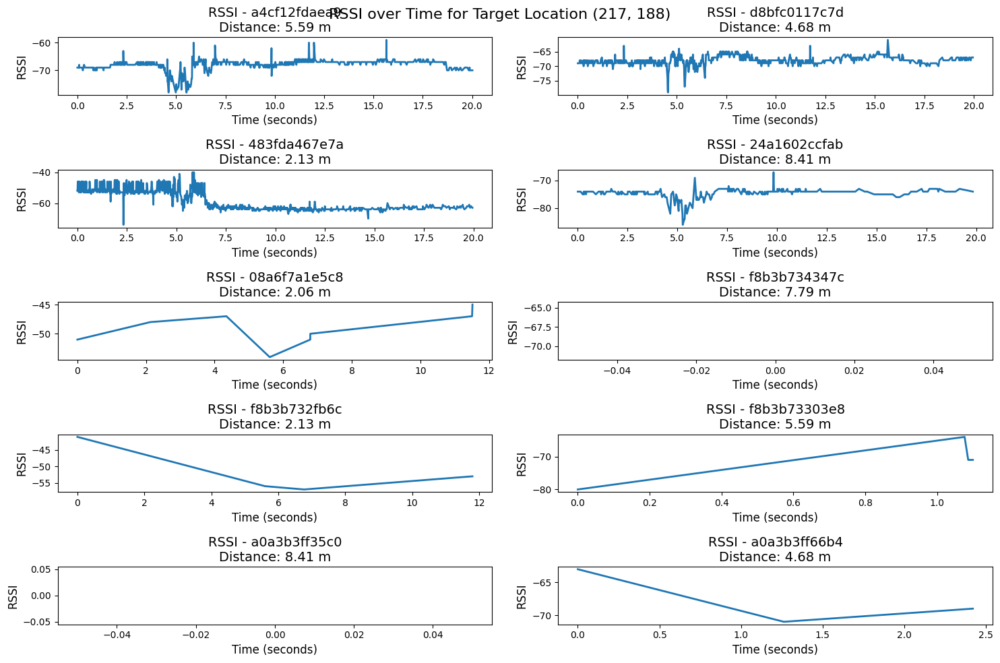

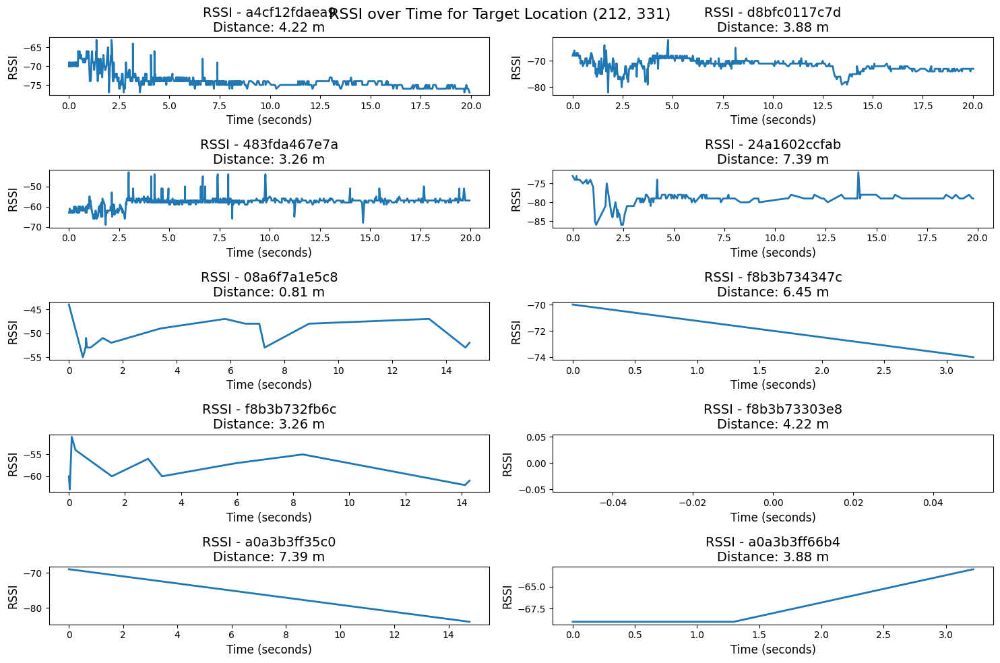

In [44]:
plot_rssi_over_time("./data/filtered/flat/P20_Pro_eval.csv")

## Error Metrics

### User Range Error

In [8]:
def prep_data(df):
    # Merge coordinates into single columns
    df["anchor_position"] = list(zip(df["anchor_position_x"], df["anchor_position_y"]))
    df["target_position"] = list(zip(df["target_position_x"], df["target_position_y"]))

    # Round the coordinates in the anchor_position and target_position columns
    df["anchor_position"] = df["anchor_position"].apply(lambda pos: (round(pos[0]), round(pos[1])))
    df["target_position"] = df["target_position"].apply(lambda pos: (round(pos[0]), round(pos[1])))

    # Drop the original coordinate columns if no longer needed
    df.drop(columns=["anchor_position_x", "anchor_position_y", "target_position_x", "target_position_y"], inplace=True)

    # Group by monitor_mac and target_position, and calculate the median RSSI
    df_median_rssi = (
        df.groupby(["target_position", "target_mac", "monitor_mac", "anchor_position"], as_index=False)
        .agg(rssi=('rssi', 'median'), group_size=('rssi', 'size'))
    )

    # choose a threshold of how many rssi readings are mandatory
    # first try it with at least 1 sample per second
    df_median_rssi_filtered = df_median_rssi[df_median_rssi["group_size"] >= 20]

    return filter_common_monitors(df_median_rssi_filtered)

In [9]:
# fingerprint data
df_fingerprint_pixel9 = prep_data(pd.read_csv("./data/filtered/flat/Pixel9.csv"))
df_fingerprint_p20 = prep_data(pd.read_csv("./data/filtered/flat/P20_Pro.csv"))
df_fingerprint_iphone = prep_data(pd.read_csv("./data/filtered/flat/iPhone.csv"))

df_fingerprint_median = pd.concat([df_fingerprint_pixel9, df_fingerprint_p20, df_fingerprint_iphone]).reset_index()

# eval data
df_eval_pixel9 = prep_data(pd.read_csv("./data/filtered/flat/Pixel9_eval.csv"))
df_eval_p20 = prep_data(pd.read_csv("./data/filtered/flat/P20_Pro_eval.csv"))
df_eval_iphone = prep_data(pd.read_csv("./data/filtered/flat/iPhone_eval.csv"))

df_eval_median = pd.concat([df_eval_pixel9, df_eval_p20, df_eval_iphone]).reset_index()
df_eval_median

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size
0,1,"(104, 657)",20f094118214,24a1602ccfab,"(744, 844)",-79.0,132
1,2,"(104, 657)",20f094118214,483fda467e7a,"(62, 42)",-76.0,93
2,3,"(104, 657)",20f094118214,a0a3b3ff35c0,"(744, 844)",-81.0,37
3,4,"(104, 657)",20f094118214,a0a3b3ff66b4,"(556, 510)",-60.0,239
4,5,"(104, 657)",20f094118214,a4cf12fdaea9,"(56, 723)",-46.0,578
...,...,...,...,...,...,...,...
297,170,"(701, 544)",d81c79de34e1,483fda467e7a,"(62, 42)",-68.0,241
298,171,"(701, 544)",d81c79de34e1,a0a3b3ff35c0,"(744, 844)",-69.5,30
299,172,"(701, 544)",d81c79de34e1,a0a3b3ff66b4,"(556, 510)",-53.5,38
300,173,"(701, 544)",d81c79de34e1,a4cf12fdaea9,"(56, 723)",-68.0,530


In [10]:
import matplotlib.pyplot as plt

# Update global settings for thesis-friendly scaling
plt.rc('font', size=12)           # Default text size
plt.rc('axes', titlesize=14)      # Title size
plt.rc('axes', labelsize=12)      # Axes labels
plt.rc('xtick', labelsize=10)     # X-tick labels
plt.rc('ytick', labelsize=10)     # Y-tick labels
plt.rc('legend', fontsize=10)     # Legend font size
plt.rc('lines', linewidth=2)      # Line width
plt.rc('lines', markersize=8)     # Marker size

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

monitor_groups = [
    ["483fda467e7a", "f8b3b732fb6c"],
    ["d8bfc0117c7d", "a0a3b3ff66b4"],
    ["24a1602ccfab", "a0a3b3ff35c0"],
    ["a4cf12fdaea9", "f8b3b73303e8"],
    ["f8b3b734347c"],
    ["08a6f7a1e5c8"]
]

monitor_friendly_names = {
    "483fda467e7a": "Monitor 1",
    "d8bfc0117c7d": "Monitor 2",
    "24a1602ccfab": "Monitor 3",
    "a4cf12fdaea9": "Monitor 4",
    "f8b3b732fb6c": "Monitor 5",
    "a0a3b3ff66b4": "Monitor 6",
    "a0a3b3ff35c0": "Monitor 7",
    "f8b3b73303e8": "Monitor 8",
    "f8b3b734347c": "Monitor 9",
    "08a6f7a1e5c8": "Monitor 10"
}

monitor_friendly_mc = {monitor_mac: "ESP8266" if monitor_mac in monitor_macs_esp8266 else "ESP32" for monitor_mac in monitor_friendly_names.keys()}

# right now only works for APB
def classify_target_location(coordinates):
    rect_x_min = 780
    rect_x_max = 1520
    rect_y_min = 0
    rect_y_max = 665

    if rect_x_min <= coordinates[0] <= rect_x_max and rect_y_min <= coordinates[1] <= rect_y_max:
        return "inside"
    else:
        return "outside"

def get_distance_and_classify(df):
    df_distances = df.copy()

    # Add the "class" column
    df_distances["class"] = df_distances["target_position"].apply(classify_target_location)

    # Add the "distance" column
    df_distances["distance"] = df_distances.apply(
        # Function to calculate the Euclidean distance# Function to calculate the Euclidean distance
        lambda row: np.linalg.norm(np.array(row["target_position"]) - np.array(row["anchor_position"])) / 100.0, axis=1
    )

    return df_distances

def fit_path_loss_model(df_distances):
    # Function to fit the data and return the parameters
    def fit_group(group):
        if group.shape[0] < 5:
            return pd.Series({"rssi_0": np.nan, "n": np.nan})
        
        distances = group["distance"].values
        rssis = group["rssi"].values

        # Fit the function to the data
        popt, _ = curve_fit(inverse_path_loss_model, rssis, distances, p0=(-50, 2))
        return pd.Series({"rssi_0": popt[0], "n": popt[1]})

    return df_distances[df_distances["distance"] > 0].groupby(["target_mac", "monitor_mac"]).apply(fit_group).reset_index()

def plot_rssi_vs_distance(df_distances, df_model_params, group=True):
    global target_macs

    grouping = monitor_groups if group else [[monitor_mac] for monitor_mac in df_distances["monitor_mac"].unique()]

    # Define marker shapes for the classes
    marker_styles = {"inside": "x", "outside": "o"}
    
    # Iterate over each group of monitor MACs
    for group_index, monitor_group in enumerate(grouping):
        # Create a figure with enough space for all subplots
        fig, axs = plt.subplots(1, len(df_distances["target_mac"].unique()), figsize=(18, 6), sharey=True)
        
        # Set the figure title for the current group
        # fig.suptitle(f"RSSI vs. Distance for Group {group_index + 1}", fontsize=16)

        # Collect handles and labels for the legend
        all_handles, all_labels = [], []

        for target_idx, target_mac in enumerate(target_macs):
            df_target = df_distances[df_distances["target_mac"] == target_mac]
            df_target_params = df_model_params[df_model_params["target_mac"] == target_mac]

            ax = axs[target_idx]  # Get the subplot for this target_mac

            dist_min = df_target["distance"].min()
            dist_max = df_target["distance"].max()
        
            for monitor_idx, monitor_mac in enumerate(monitor_group):
                df_monitor = df_target[df_target["monitor_mac"] == monitor_mac]
                df_monitor_params = df_target_params[df_target_params["monitor_mac"] == monitor_mac]

                # Scatter plot with marker styles based on classes
                for target_class in df_monitor["class"].unique():
                    df_class = df_monitor[df_monitor["class"] == target_class]
                    label = f'{monitor_friendly_names[monitor_mac]} ({monitor_friendly_mc[monitor_mac]})'
                    scatter = ax.scatter(
                            df_class["distance"], 
                            df_class["rssi"], 
                            label=label, 
                            marker=marker_styles[target_class],
                            color=plt.cm.tab10(monitor_idx),
                            alpha=0.7
                        )

                    # Collect handles and labels only if not already added
                    if label not in all_labels:
                        all_handles.append(scatter)
                        all_labels.append(label)

                if len(df_monitor_params.index) > 0:
                    rssi_0 = df_monitor_params["rssi_0"].item()
                    n = df_monitor_params["n"].item()
                        
                    # Generate fit line
                    fit_distances = np.linspace(dist_min, dist_max, 500)
                    fit_rssis = path_loss_model(fit_distances, rssi_0, n)
                        
                    # Plot the fit
                    label = f'Fitted Model for {monitor_friendly_names[monitor_mac]}'
                    (line_handle, ) = ax.plot(fit_distances, fit_rssis, label=label, linestyle='--')

                    # Collect handles and labels only if not already added
                    if label not in all_labels:
                        all_handles.append(line_handle)
                        all_labels.append(label)
        
            # Customize the plot
            ax.set_title(f"{device_names[target_mac]}")
            ax.set_xlabel("Distance (m)")
            ax.set_ylabel("Median RSSI (dBm)")
            ax.grid(True)
        
        # Add a shared legend above the subplots
        fig.legend(
            all_handles,
            all_labels,
            loc='upper right',  # Anchor the legend to its top-right corner
            ncol=1,             # Single column legend
            fontsize='small',
            bbox_to_anchor=(0.99, 0.93),  # Adjust these values for precise alignment
        )

        fig.tight_layout()
        plt.show()

Fingerprint:


C:\Users\nikok\AppData\Local\Temp\ipykernel_8024\40334638.py:69: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df_distances[df_distances["distance"] > 0].groupby(["target_mac", "monitor_mac"]).apply(fit_group).reset_index()


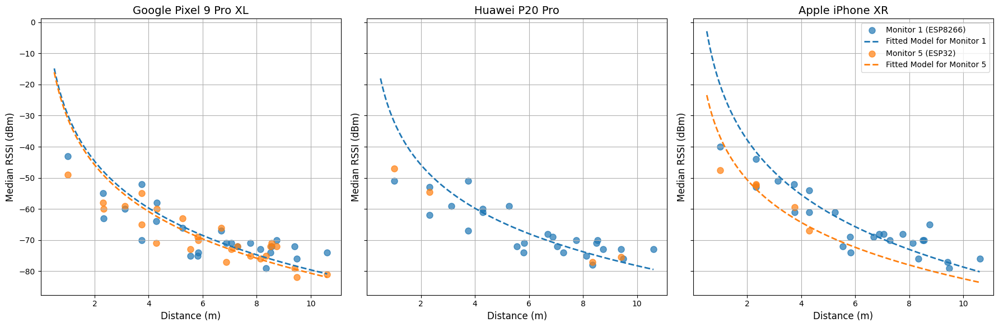

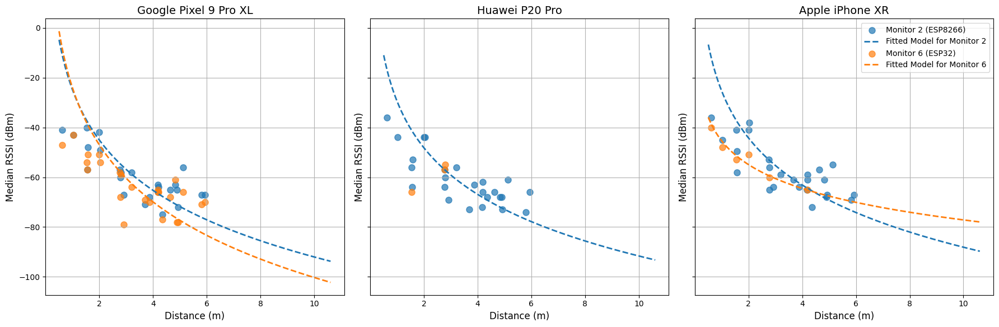

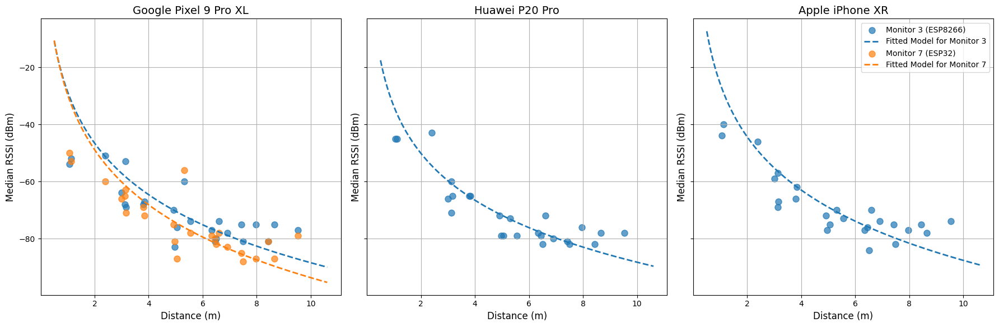

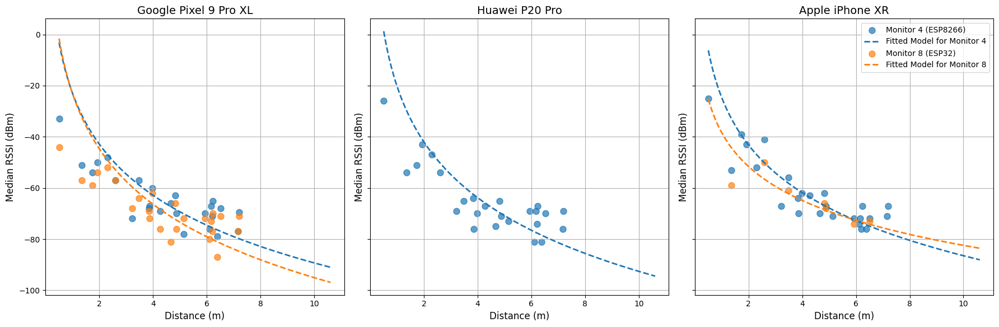

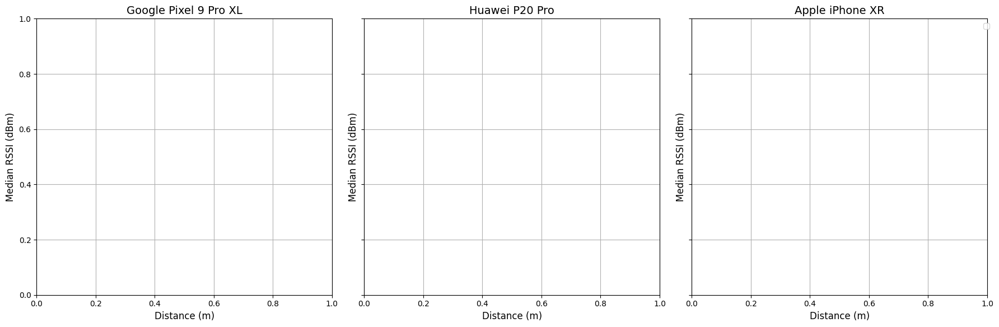

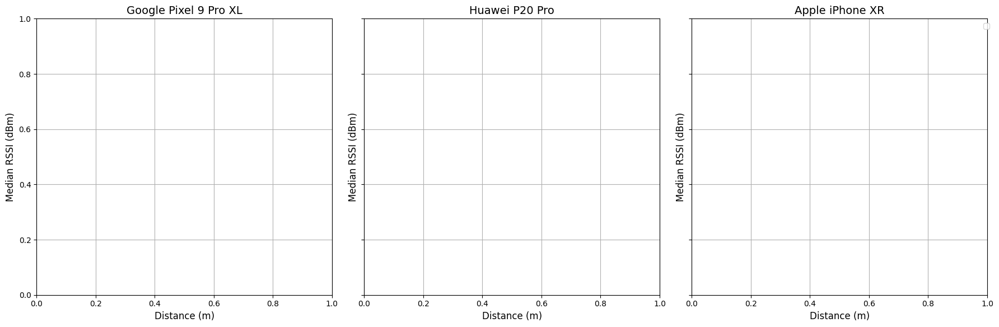

Eval:


C:\Users\nikok\AppData\Local\Temp\ipykernel_8024\40334638.py:69: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df_distances[df_distances["distance"] > 0].groupby(["target_mac", "monitor_mac"]).apply(fit_group).reset_index()


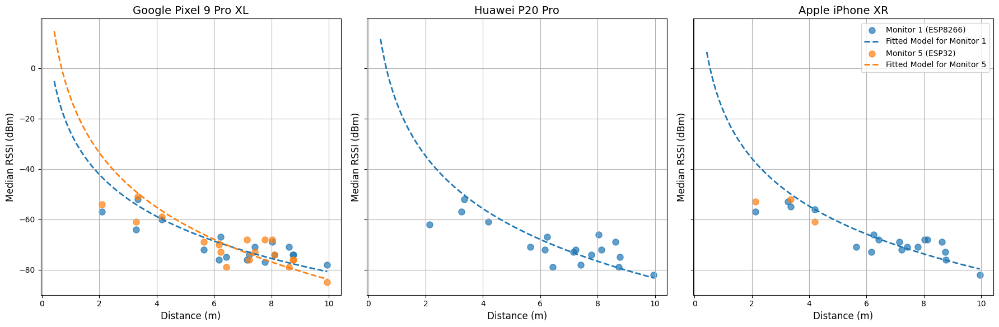

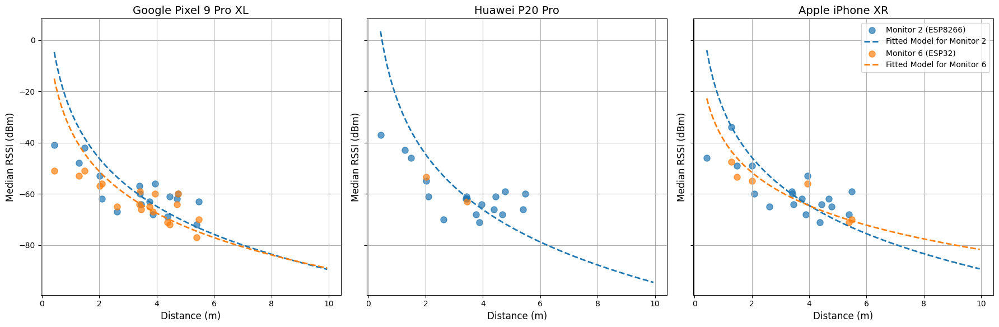

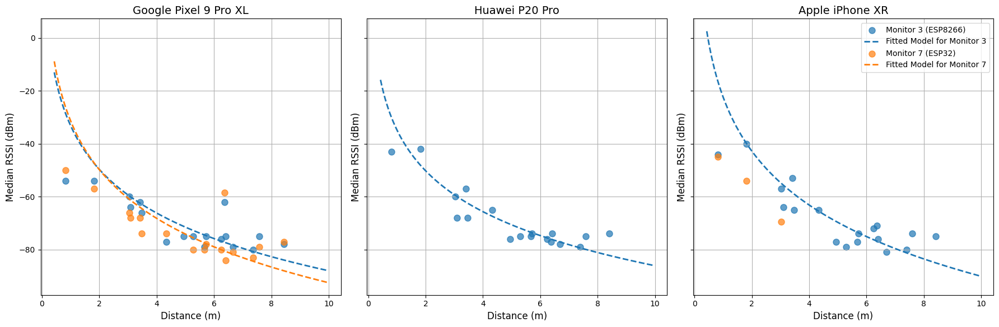

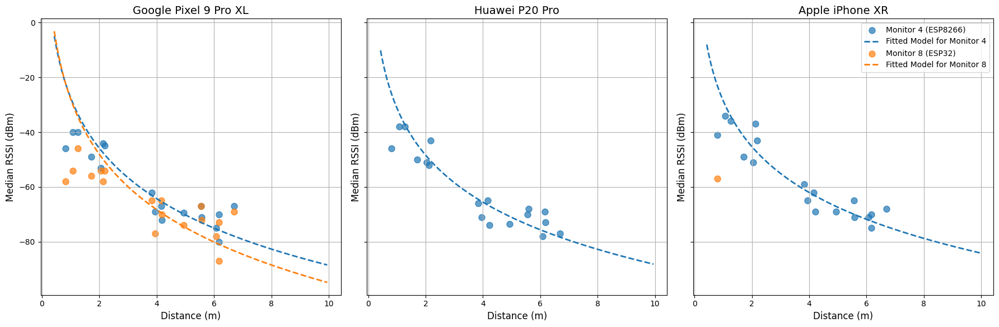

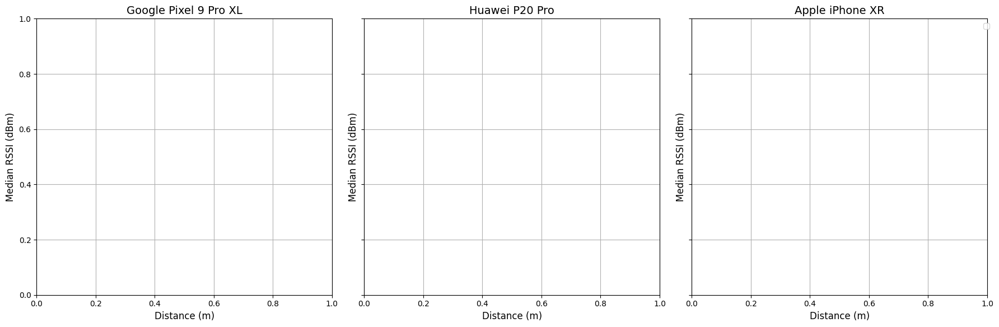

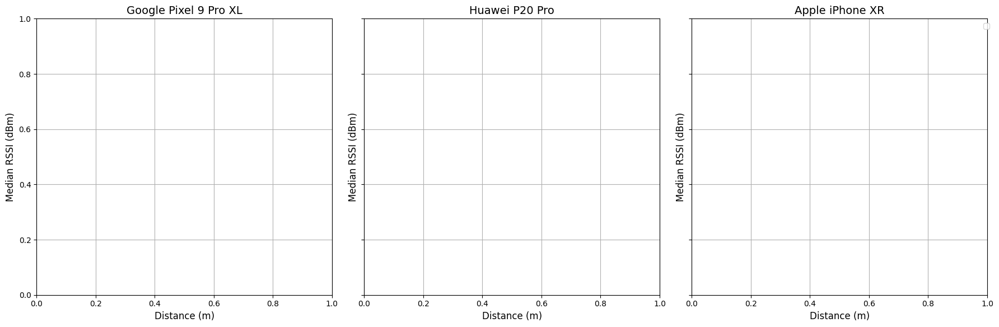

In [12]:
# fingerprint data
print("Fingerprint:")
df_fingerprint_distances = get_distance_and_classify(df_fingerprint_median)
df_fingerprint_model_params = fit_path_loss_model(df_fingerprint_distances)
plot_rssi_vs_distance(df_fingerprint_distances, df_fingerprint_model_params)

# eval data
print("Eval:")
df_eval_distances = get_distance_and_classify(df_eval_median)
df_eval_model_params = fit_path_loss_model(df_eval_distances)
plot_rssi_vs_distance(df_eval_distances, df_eval_model_params)

In [13]:
df_eval_distances

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size,class,distance
0,1,"(104, 657)",20f094118214,24a1602ccfab,"(744, 844)",-79.0,132,outside,6.667601
1,2,"(104, 657)",20f094118214,483fda467e7a,"(62, 42)",-76.0,93,outside,6.164325
2,3,"(104, 657)",20f094118214,a0a3b3ff35c0,"(744, 844)",-81.0,37,outside,6.667601
3,4,"(104, 657)",20f094118214,a0a3b3ff66b4,"(556, 510)",-60.0,239,outside,4.753031
4,5,"(104, 657)",20f094118214,a4cf12fdaea9,"(56, 723)",-46.0,578,outside,0.816088
...,...,...,...,...,...,...,...,...,...
297,170,"(701, 544)",d81c79de34e1,483fda467e7a,"(62, 42)",-68.0,241,outside,8.126038
298,171,"(701, 544)",d81c79de34e1,a0a3b3ff35c0,"(744, 844)",-69.5,30,outside,3.030660
299,172,"(701, 544)",d81c79de34e1,a0a3b3ff66b4,"(556, 510)",-53.5,38,outside,1.489329
300,173,"(701, 544)",d81c79de34e1,a4cf12fdaea9,"(56, 723)",-68.0,530,outside,6.693773


In [14]:
def get_user_range_error(df_distance, df_model_params):
    df_combined = pd.merge(df_distance, df_model_params, left_on=["target_mac", "monitor_mac"], right_on=["target_mac", "monitor_mac"], how="left")

    df_combined["estimated_distance"] = df_combined.apply(lambda row: inverse_path_loss_model(row["rssi"], row["rssi_0"], row["n"]), axis=1)
    df_combined["ure"] = df_combined.apply(lambda row: abs(row["distance"] - row["estimated_distance"]), axis=1)

    return df_combined

def plot_ure(dfs_ure, df_labels):
    global target_macs

    # Create a figure with enough space for all subplots
    fig1, axs1 = plt.subplots(1, len(target_macs), figsize=(18, 4), sharey=True)
    fig2, axs2 = plt.subplots(1, len(target_macs), figsize=(18, 5), sharey=True)
    
    # Set the figure title for the current group
    # fig.suptitle(f"RSSI vs. Distance for Group {group_index + 1}", fontsize=16)

    for target_idx, target_mac in enumerate(target_macs):
        df_targets = [df[df["target_mac"] == target_mac] for df in dfs_ure]
        ures = [df_target["ure"].to_numpy() for df_target in df_targets]

        ax1 = axs1[target_idx]  # Get the subplot for this target_mac

        # Plot the boxplots for URE
        ax1.boxplot(ures, 
                    tick_labels=df_labels, 
                    showfliers=False)  # Disable rendering of outliers
        ax1.set_title(f"{device_names[target_mac]}")
        ax1.set_ylabel("User Range Error (m)")
        ax1.grid(True)
    
        # Sort the URE values for cumulative plotting
        ures_sorted = [np.sort(ure) for ure in ures]
        
        # Calculate the cumulative distribution
        cdfs = [np.arange(0, len(ure_sorted)) / (len(ure_sorted) - 1) for ure_sorted in ures_sorted]
        
        ax2 = axs2[target_idx]  # Get the subplot for this target_mac

        # Plot the CDF for all monitors and the two groups
        for cdf_idx, cdf in enumerate(cdfs):
            ax2.plot(ures_sorted[cdf_idx], cdf, label=df_labels[cdf_idx], color=plt.cm.tab10(cdf_idx))

        percentiles = [50, 95]

        # Add percentile markers with striped lines
        for p in percentiles:
            ure_percentiles = [np.percentile(ure, p) if len(ure) > 0 else np.nan for ure in ures]
            max_percentile = max(ure_percentiles)

            # Draw dashed lines for "All Monitors"
            ax2.axhline(y=p / 100.0, xmin=0, xmax=(max_percentile - ax2.get_xlim()[0]) / (ax2.get_xlim()[1] - ax2.get_xlim()[0]), 
                           color='black', linestyle='dashed', linewidth=0.8, alpha=0.7)

            for ure_percentile_idx, ure_percentile in enumerate(ure_percentiles):
                ax2.axvline(x=ure_percentile, ymin=0, ymax=(p / 100.0 - ax2.get_ylim()[0]) / (ax2.get_ylim()[1] - ax2.get_ylim()[0]), color=plt.cm.tab10(ure_percentile_idx), linestyle='dashed', linewidth=0.8, alpha=0.7)
                #ax2.scatter(ure_percentile, p / 100.0, color=plt.cm.tab10(ure_percentile_idx), marker='o')

        # Add legend
        ax2.legend(
            loc='lower right'
        )

        # Limit the x-axis to 100 meters
        # plt.xlim(0, 100)

        # ax2.set_title(f"Cumulative Distribution of URE for {device_names[target_mac]}")
        ax2.set_title(f"{device_names[target_mac]}")
        ax2.set_xlabel("User Range Error (m)")
        ax2.set_ylabel("Cumulative Probability")
        ax2.grid(True)


    fig1.tight_layout()
    fig2.tight_layout()
    plt.show()

def rmse(series):
    return np.sqrt((series**2).mean())

def print_ure_statistics(dfs_ure, df_labels):
    global target_macs
    
    for target_mac in target_macs:
        print(f"For {device_names[target_mac]}:")

        ure_groups = []
        ure_means = []
        ure_medians = []
        ure_rmses = []

        for df, df_label in zip(dfs_ure, df_labels):
            df_target = df[df["target_mac"] == target_mac]

            ure_groups.append(df_label)
            ure_means.append(df_target["ure"].mean())
            ure_medians.append(df_target["ure"].median())
            ure_rmses.append(rmse(df_target["ure"]))

        print(pd.DataFrame({
            'Group': ure_groups,
            'Mean': ure_means,
            'Median': ure_medians,
            'RMSE': ure_rmses
        }))

        print()

Fingerprint:


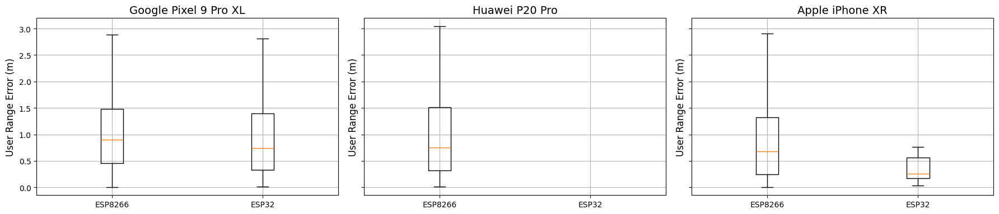

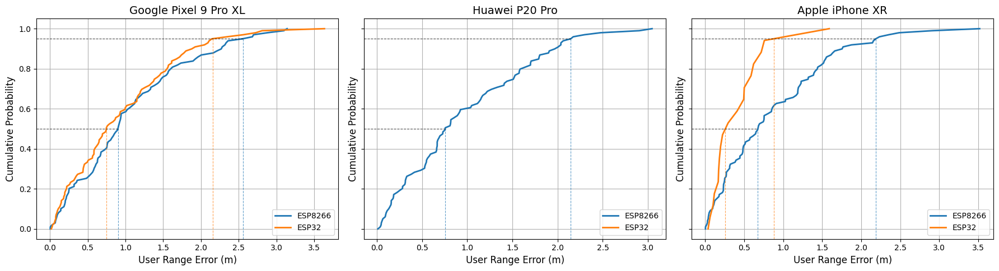

Eval:


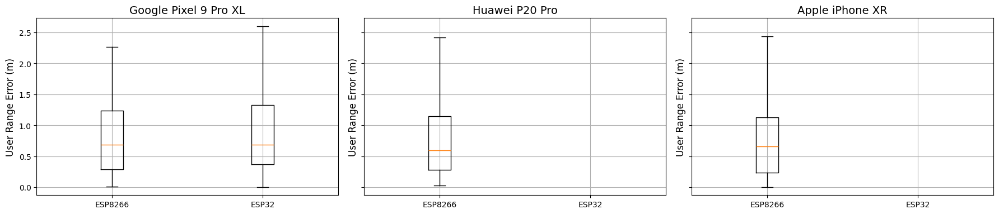

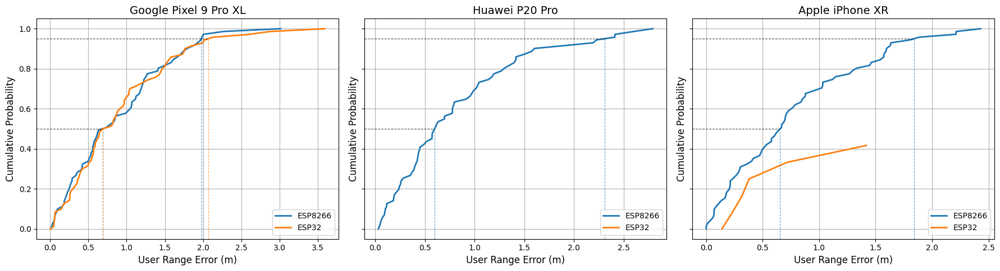

For Google Pixel 9 Pro XL:
     Group      Mean    Median      RMSE
0  ESP8266  0.866435  0.684921  1.086022
1    ESP32  0.897284  0.687981  1.147012

For Huawei P20 Pro:
     Group      Mean    Median      RMSE
0  ESP8266  0.800539  0.597855  1.043439
1    ESP32       NaN       NaN       NaN

For Apple iPhone XR:
     Group      Mean    Median      RMSE
0  ESP8266  0.761044  0.654919  0.972149
1    ESP32  0.535170  0.349435  0.689448

Different:


c:\Users\nikok\miniconda3\lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


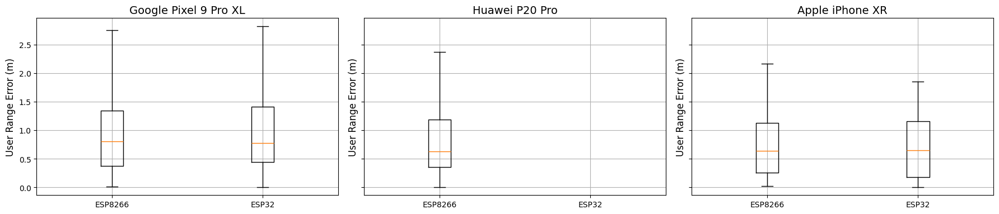

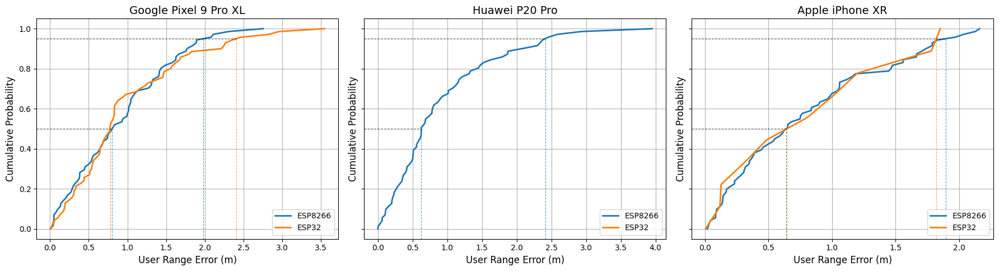

For Google Pixel 9 Pro XL:
     Group      Mean    Median      RMSE
0  ESP8266  0.896682  0.803046  1.100947
1    ESP32  0.961926  0.775822  1.225248

For Huawei P20 Pro:
     Group      Mean    Median      RMSE
0  ESP8266  0.894928  0.627467  1.190899
1    ESP32       NaN       NaN       NaN

For Apple iPhone XR:
     Group      Mean    Median      RMSE
0  ESP8266  0.779819  0.637769  0.993178
1    ESP32  0.770174  0.644558  1.004435



In [15]:
df_labels = ["ESP8266", "ESP32"] #, "All Monitors"]

# fingerprint data
print("Fingerprint:")
df_fingerprint_ure_all = get_user_range_error(df_fingerprint_distances, df_fingerprint_model_params)
df_fingerprint_ure_esp8266 = filter_esp8266(df_fingerprint_ure_all)
df_fingerprint_ure_esp32 = filter_esp32(df_fingerprint_ure_all)
dfs_fingerprint_ure = [df_fingerprint_ure_esp8266, df_fingerprint_ure_esp32] #, df_fingerprint_ure_all]

plot_ure(dfs_fingerprint_ure, df_labels)

# eval data
print("Eval:")
df_eval_ure_all = get_user_range_error(df_eval_distances, df_eval_model_params)
df_eval_ure_esp8266 = filter_esp8266(df_eval_ure_all)
df_eval_ure_esp32 = filter_esp32(df_eval_ure_all)
dfs_eval_ure = [df_eval_ure_esp8266, df_eval_ure_esp32] #, df_eval_ure_all]

plot_ure(dfs_eval_ure, df_labels)
print_ure_statistics(dfs_eval_ure, df_labels)

# different data for the model params
print("Different:")
df_different_ure_all = get_user_range_error(df_eval_distances, df_fingerprint_model_params)
df_different_ure_esp8266 = filter_esp8266(df_different_ure_all)
df_different_ure_esp32 = filter_esp32(df_different_ure_all)
dfs_different_ure = [df_different_ure_esp8266.dropna(subset=['ure']), df_different_ure_esp32.dropna(subset=['ure'])] #, df_different_ure_all]

plot_ure(dfs_different_ure, df_labels)
print_ure_statistics(dfs_different_ure, df_labels)

In [16]:
def get_sample_sizes(df, relevant_columns):
    return df.groupby('target_mac')[relevant_columns].apply(lambda group: group.notna().sum())

In [17]:
ure_relevant_columns = ['ure']

print("ESP8266 Sample Size:")
get_sample_sizes(df_different_ure_esp8266, ure_relevant_columns)

ESP8266 Sample Size:


,ure
target_mac,
20f094118214,72
342eb61ec446,72
d81c79de34e1,72


In [18]:
print("ESP32 Sample Size:")
get_sample_sizes(df_different_ure_esp32, ure_relevant_columns)

ESP32 Sample Size:


,ure
target_mac,
20f094118214,71
342eb61ec446,0
d81c79de34e1,10


In [19]:
df_different_ure_esp32[df_different_ure_esp32['target_mac'] == 'd81c79de34e1']["ure"].sort_values()

288    0.004461
270    0.117926
249    0.127119
299    0.314336
224    0.485173
262    0.803944
234    1.012657
267    1.200266
229    1.783107
221    1.852754
287         NaN
293         NaN
298         NaN
Name: ure, dtype: float64

In [20]:
df_fingerprint_model_params.to_csv("./data/filtered/flat/fingerprint_model_params_4_monitors.csv", index=False)

- Pixel 9 has weird fingerprint data
- P20 & iPhone are good though:
  - About same URE on same data & on fingerprint data
  - iPhone overall the best

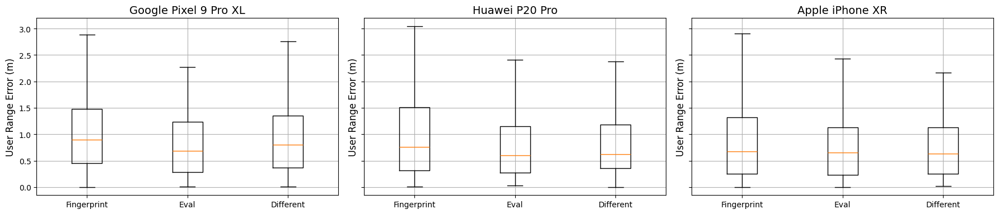

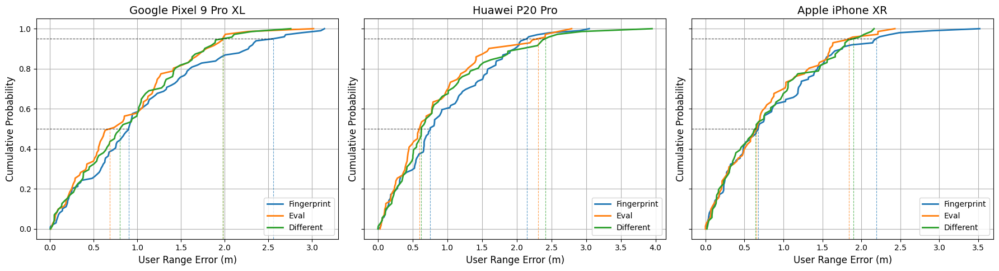

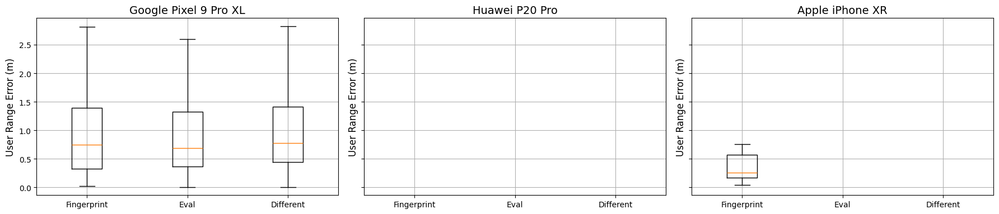

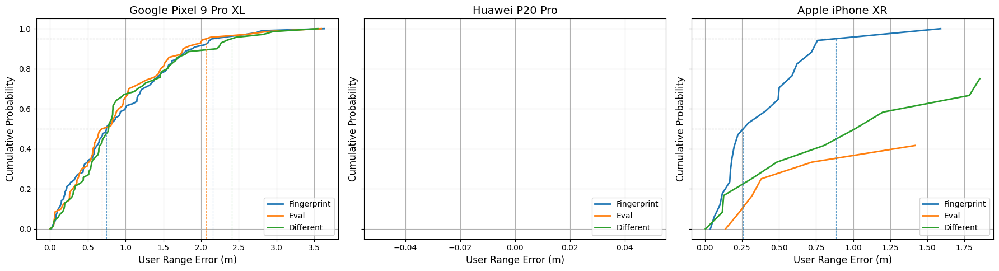

In [21]:
plot_ure([df_fingerprint_ure_esp8266, df_eval_ure_esp8266, df_different_ure_esp8266], ["Fingerprint", "Eval", "Different"])
plot_ure([df_fingerprint_ure_esp32, df_eval_ure_esp32, df_different_ure_esp32], ["Fingerprint", "Eval", "Different"])

In [22]:
df_different_ure_esp32.sort_values("ure")

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size,class,distance,rssi_0,n,estimated_distance,ure
110,138,"(437, 682)",20f094118214,f8b3b73303e8,"(56, 723)",-65.0,397,outside,3.831997,-22.952801,7.211545,3.828723,0.003274
288,152,"(661, 682)",d81c79de34e1,a0a3b3ff66b4,"(556, 510)",-55.0,25,outside,2.015167,-45.358232,3.178443,2.010707,0.004461
26,33,"(179, 747)",20f094118214,a0a3b3ff35c0,"(744, 844)",-78.0,49,outside,5.732661,-29.617585,6.406450,5.691335,0.041325
59,74,"(250, 657)",20f094118214,a0a3b3ff66b4,"(556, 510)",-64.0,172,outside,3.394775,-23.976841,7.628374,3.347046,0.047729
6,7,"(104, 657)",20f094118214,f8b3b732fb6c,"(62, 42)",-70.0,67,outside,6.164325,-30.848424,4.982297,6.106800,0.057524
...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,105,"(435, 833)",342eb61ec446,a0a3b3ff66b4,"(556, 510)",-63.0,25,outside,3.449203,NaN,NaN,NaN,NaN
206,135,"(663, 681)",342eb61ec446,a0a3b3ff66b4,"(556, 510)",-53.5,22,outside,2.017176,NaN,NaN,NaN,NaN
287,151,"(661, 682)",d81c79de34e1,a0a3b3ff35c0,"(744, 844)",-54.0,24,outside,1.820247,NaN,NaN,NaN,NaN
293,161,"(663, 835)",d81c79de34e1,a0a3b3ff35c0,"(744, 844)",-45.0,32,outside,0.814985,NaN,NaN,NaN,NaN


### Accuracy

In [23]:
from scipy.optimize import least_squares

class AbstractLocalization(ABC):

    def __init__(self):
        pass

    @abstractmethod
    def localize(self, rssis):
        pass
    
    def get_relevant_anchor_stats(self, anchor_stats, rssis):
        monitor_macs_intersec = anchor_stats.keys() & rssis.keys()
        anchor_stats_intersec = [anchor_stats[monitor_mac] for monitor_mac in monitor_macs_intersec]
        rssis_intersec = [rssis[monitor_mac] for monitor_mac in monitor_macs_intersec]
        
        return monitor_macs_intersec, anchor_stats_intersec, rssis_intersec
    
    def get_relevant_anchor_stats_all(self, anchor_stats, rssis, model_params):
        monitor_macs_intersec = anchor_stats.keys() & rssis.keys() & model_params.keys()
        anchor_stats_intersec = [anchor_stats[monitor_mac] for monitor_mac in monitor_macs_intersec]
        rssis_intersec = [rssis[monitor_mac] for monitor_mac in monitor_macs_intersec]
        model_params_intersec = [model_params[monitor_mac] for monitor_mac in monitor_macs_intersec]
        
        return monitor_macs_intersec, anchor_stats_intersec, rssis_intersec, model_params_intersec

class TrilaterationLeastSquaresLocalization(AbstractLocalization):
    def __init__(self, anchor_positions, monitor_model_params):
        super().__init__()
        
        self.anchor_positions = anchor_positions
        self.monitor_model_params = monitor_model_params
    
    def localize(self, rssis):
        relevant_monitor_macs, relevant_positions, relevant_rssis, relevant_model_params = self.get_relevant_anchor_stats_all(self.anchor_positions, rssis, self.monitor_model_params)
        relevant_distances = [inverse_path_loss_model(rssi, model_params[0], model_params[1]) * 100.0 for rssi, model_params in zip(relevant_rssis, relevant_model_params)] # m to cm

        relevant_rssis = np.array(relevant_rssis)
        relevant_positions = np.array(relevant_positions)
        relevant_distances = np.array(relevant_distances)
        print(relevant_positions)

        # relevant_positions = relevant_positions / 100.0
        # relevant_distances = relevant_distances / 100.0

        valid_rows = ~np.isnan(relevant_distances)
        relevant_rssis = relevant_rssis[valid_rows]
        relevant_positions = relevant_positions[valid_rows]
        relevant_distances = relevant_distances[valid_rows]

        print("rssis:")
        print(relevant_rssis)
        print("positions:")
        print(relevant_positions)
        print("distances:")
        print(relevant_distances)
        
        # Number of known positions
        n = len(relevant_positions)

        if n < 2:
            return {
                'position': None,
                'distances': {monitor_mac: distance for monitor_mac, distance in zip(relevant_monitor_macs, relevant_distances)}
            }
        
        '''
        # Build the A matrix and b vector
        A = []
        b = []
        
        x_n, y_n = relevant_positions[n-1]
        d_n = relevant_distances[n-1]
        for i in range(n - 1):
            x_i, y_i = relevant_positions[i]
            d_i = relevant_distances[i]
            A.append([2*(x_i - x_n), 2*(y_i - y_n)])
            b.append(x_i**2 + y_i**2 - x_n**2 - y_n**2 - d_i**2 + d_n**2)
        A = np.array(A)
        b = np.array(b)

        print("A:")
        print(A)
        print("b:")
        print(b)

        # Debug: Check condition number
        condition_number = np.linalg.cond(A.T @ A)
        print(f"Condition Number: {condition_number}")

        # Compute the least squares solution using the normal equation: x = (A^T A)^(-1) A^T b
        position, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
        '''

        # Initial guess for the target position: mean of anchor positions
        initial_guess = np.mean(relevant_positions, axis=0)

        def residuals(target):
            x, y = target
            return [np.sqrt((x - px)**2 + (y - py)**2) - d for (px, py), d in zip(relevant_positions, relevant_distances)]

        # Use least_squares for optimization
        result = least_squares(
            residuals,
            initial_guess,
            method='lm',
            ftol=1e-9,
            xtol=1e-9,
            max_nfev=5000
        )
        position = result.x if result.success else None

        print("Lstsq data:")
        print(position)
        # print(residuals)
        # print(rank)
        # print(s)

        # position *= 100.0
        
        return {
            'position': position,
            'distances': {monitor_mac: distance for monitor_mac, distance in zip(relevant_monitor_macs, relevant_distances)}
        }

class TrilaterationWeightedCentroidLocalization(AbstractLocalization):
    def __init__(self, anchor_positions, monitor_model_params, weight_func):
        super().__init__()
        
        self.anchor_positions = anchor_positions
        self.monitor_model_params = monitor_model_params
        self.weight_func = weight_func
    
    def localize(self, rssis):
        relevant_monitor_macs, relevant_positions, relevant_rssis = self.get_relevant_anchor_stats(self.anchor_positions, rssis)        
        relevant_positions_np = np.array(relevant_positions)

        # Calculate the weights using the custom function
        weights = np.array([self.weight_func(rssi, self.monitor_model_params[monitor_mac][0], self.monitor_model_params[monitor_mac][1]) for rssi, monitor_mac in zip(relevant_rssis, relevant_monitor_macs)])
        weight_sum = np.sum(weights)

        # Normalize the weights so they sum up to 1
        normalized_weights = weights / weight_sum
        
        # Weighted sum of positions
        x = np.sum([w * pos[0] for w, pos in zip(normalized_weights, relevant_positions_np)])
        y = np.sum([w * pos[1] for w, pos in zip(normalized_weights, relevant_positions_np)])
        
        position = (x, y)
        
        return {
            'position': position
        }

class FingerprintingLocalization(AbstractLocalization):
    def __init__(self, df_fingerprints, background_size, heatmap_resolution=5.0): # every 5cm
        super().__init__()
        
        x = np.arange(0, background_size[0], heatmap_resolution)
        y = np.arange(0, background_size[1], heatmap_resolution)
        self.pos_lookup_x = np.append(x, background_size[0]) # include boundary
        self.pos_lookup_y = np.append(y, background_size[1])
        num_x = len(self.pos_lookup_x)
        num_y = len(self.pos_lookup_y)
            
        gx, gy = np.meshgrid(self.pos_lookup_x, self.pos_lookup_y)
        gx, gy = gx.flatten(), gy.flatten()
        
        def generate_interpolated_fingerprint_map(monitor_mac):
            monitor_rows = df_fingerprints[df_fingerprints['monitor_mac'] == monitor_mac]
            
            target_positions = monitor_rows['target_position'].to_list()
            (target_positions_x, target_positions_y) = zip(*target_positions)
            rssi_medians = monitor_rows['rssi'].to_list()
            
            
            # from https://github.com/jantman/python-wifi-survey-heatmap/blob/master/wifi_survey_heatmap/heatmap.py
            
            rbf = Rbf(target_positions_x, target_positions_y, rssi_medians, function='linear')
            z = rbf(gx, gy)
            z = z.reshape((num_y, num_x))
            
            return z
        
        monitor_macs = df_fingerprints['monitor_mac'].unique()
        self.interpolated_fingerprints = {monitor_mac: generate_interpolated_fingerprint_map(monitor_mac) for monitor_mac in monitor_macs}
    
    def localize(self, rssis):
        _, relevant_interpolated_fingerprints, relevant_rssis = self.get_relevant_anchor_stats(self.interpolated_fingerprints, rssis)
        
        diff = np.moveaxis(relevant_interpolated_fingerprints, 0, -1) - relevant_rssis        
        norm = np.linalg.norm(diff, axis=2)
        min_pos_heatmap = np.unravel_index(np.argmin(norm, axis=None), norm.shape)        
        min_pos = (self.pos_lookup_x[min_pos_heatmap[1]], self.pos_lookup_y[min_pos_heatmap[0]])
        
        position = min_pos
        
        return {
            'position': position,
            'heatmap': norm
        }

In [24]:
def combine_df_model_params(df, df_model_params):
    return pd.merge(df, df_model_params, left_on=["target_mac", "monitor_mac"], right_on=["target_mac", "monitor_mac"], how="left")

df_fingerprint_combined = combine_df_model_params(df_fingerprint_distances, df_fingerprint_model_params)
df_eval_combined = combine_df_model_params(df_eval_distances, df_eval_model_params)
df_different_combined = combine_df_model_params(df_eval_distances, df_fingerprint_model_params)

df_fingerprint_combined

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size,class,distance,rssi_0,n
0,1,"(100, 595)",20f094118214,24a1602ccfab,"(744, 844)",-78.0,215,outside,6.904614,-28.583836,5.987054
1,2,"(100, 595)",20f094118214,483fda467e7a,"(62, 42)",-75.0,88,outside,5.543041,-29.653660,4.993172
2,3,"(100, 595)",20f094118214,a0a3b3ff35c0,"(744, 844)",-83.0,32,outside,6.904614,-29.617585,6.406450
3,4,"(100, 595)",20f094118214,a0a3b3ff66b4,"(556, 510)",-68.0,165,outside,4.638545,-23.976841,7.628374
4,5,"(100, 595)",20f094118214,a4cf12fdaea9,"(56, 723)",-51.0,759,outside,1.353514,-22.832207,6.648333
...,...,...,...,...,...,...,...,...,...,...,...
420,236,"(753, 544)",d81c79de34e1,24a1602ccfab,"(744, 844)",-59.0,369,outside,3.001350,-25.739084,6.188637
421,237,"(753, 544)",d81c79de34e1,483fda467e7a,"(62, 42)",-70.0,547,outside,8.540989,-20.216780,5.846079
422,239,"(753, 544)",d81c79de34e1,a0a3b3ff66b4,"(556, 510)",-51.0,27,outside,1.999125,-45.358232,3.178443
423,240,"(753, 544)",d81c79de34e1,a4cf12fdaea9,"(56, 723)",-67.0,1144,outside,7.196180,-24.554863,6.194022


In [25]:
def estimate_positions(df_combined):
    def calculate_distance(target_pos, est_pos):
        return np.sqrt((est_pos[0] - target_pos[0])**2 + (est_pos[1] - target_pos[1])**2)

    def aggregate_positions(group):
        anchor_positions = group.set_index('monitor_mac')['anchor_position'].to_dict()
        anchor_rssis = group.set_index('monitor_mac')['rssi'].to_dict()
        anchor_model_params = group.set_index('monitor_mac')[['rssi_0', 'n']].apply(tuple, axis=1).to_dict()

        print("GROUP:")
        print(group)

        num_of_datapoints = group.shape[0]
        print("Number of rows:")
        print(num_of_datapoints)

        target_position = group['target_position'].unique()[0]
        print(target_position)

        
        estimation_tls = None
        distance_error_tls = None
        estimation_twcl_dist_3 = None
        distance_error_twcl_dist_3 = None
        estimation_twcl_rssi_7 = None
        distance_error_twcl_rssi_7 = None
        estimation_fpl = None
        distance_error_fpl = None

        if num_of_datapoints >= 2:
            tls = TrilaterationLeastSquaresLocalization(anchor_positions, anchor_model_params)
            estimation_tls_raw = tls.localize(anchor_rssis)['position']
            if estimation_tls_raw is not None:
                estimation_tls = tuple(estimation_tls_raw)
                distance_error_tls = calculate_distance(target_position, estimation_tls)

            def weight_distance_3(rssi, rssi_0, n):
                if np.isnan(rssi_0) or np.isnan(n):
                    return 0.0 # result is not impacted by this
                
                return pow(inverse_path_loss_model(rssi, rssi_0, n), -3.0) # try different exponents → 3.0 worked best
            
            twcl_dist_3 = TrilaterationWeightedCentroidLocalization(anchor_positions, anchor_model_params, weight_distance_3)
            estimation_twcl_dist_3 = tuple(twcl_dist_3.localize(anchor_rssis)['position'])
            distance_error_twcl_dist_3 = calculate_distance(target_position, estimation_twcl_dist_3)

            def weight_rssi_7(rssi, rssi_0, n):
                return pow(abs(rssi), -7.0) # try different exponents → 7.0 worked best
            
            twcl_rssi_7 = TrilaterationWeightedCentroidLocalization(anchor_positions, anchor_model_params, weight_rssi_7)
            estimation_twcl_rssi_7 = tuple(twcl_rssi_7.localize(anchor_rssis)['position'])
            distance_error_twcl_rssi_7 = calculate_distance(target_position, estimation_twcl_rssi_7)

            print("target_macs_")
            df_fingerprints_target_mac = df_fingerprint_median[df_fingerprint_median["target_mac"] == group["target_mac"].unique().item()]
            print(df_fingerprints_target_mac)
            
            fpl = FingerprintingLocalization(df_fingerprints_target_mac, (819, 965)) # TODO: replace with real size
            estimation_fpl = tuple(fpl.localize(anchor_rssis)['position'])
            distance_error_fpl = calculate_distance(target_position, estimation_fpl)

        return pd.Series({
            'estimation_tls': estimation_tls,
            'distance_error_tls': distance_error_tls,
            'estimation_twcl_dist_3': estimation_twcl_dist_3,
            'distance_error_twcl_dist_3': distance_error_twcl_dist_3,
            'estimation_twcl_rssi_7': estimation_twcl_rssi_7,
            'distance_error_twcl_rssi_7': distance_error_twcl_rssi_7,
            'estimation_fpl': estimation_fpl,
            'distance_error_fpl': distance_error_fpl,
        })

    return df_combined.groupby(['target_mac', 'target_position'])[['target_mac', 'target_position', 'monitor_mac', 'anchor_position', 'rssi', 'rssi_0', 'n']].apply(aggregate_positions).reset_index()

In [101]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import get_cmap
from matplotlib.lines import Line2D  # For custom legend lines

def plot_distances(df, target_position, estimated_position, background_image_path = "./images/apb_3081_scaled_fingerprints.png"):
    """
    Plot monitors (anchors) and circles representing distances and estimated distances.

    Parameters:
    - df: pandas DataFrame with columns: 'anchor_position', 'distance', 'estimated_distance', 'target_position'.
    """
    # Initialize the plot
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot background image if provided
    if background_image_path:
        img = plt.imread(background_image_path)
        ax.imshow(img, aspect='auto', alpha=0.5)

    # Get a colormap
    cmap = get_cmap("tab10")

    # Plot the target position as a green dot
    ax.plot(*target_position, 'o', marker='^', markerfacecolor=cmap(8), markeredgecolor='black', label="Target Position")

    # Plot the target position as a green dot
    ax.plot(*estimated_position, 'o', marker='s', markerfacecolor=cmap(9), markeredgecolor='black', label="Estimated Position")

    # Loop through each monitor (anchor)
    for idx, (anchor_pos, distance, est_distance) in enumerate(
        zip(df['anchor_position'], df['distance'], df['estimated_distance'])
    ):
        color = cmap(idx % 10)  # Get a distinct color for each monitor

        # Plot the monitor as a dot
        ax.plot(*anchor_pos, 'o', color=color, label=f"Monitor {idx + 1}")

        # Plot the circle for actual distance
        actual_circle = plt.Circle(anchor_pos, distance * 100.0, color=color, linestyle='--', fill=False)
        ax.add_artist(actual_circle)

        # Plot the circle for estimated distance
        estimated_circle = plt.Circle(anchor_pos, est_distance * 100.0, color=color, linestyle='-', fill=False)
        ax.add_artist(estimated_circle)

    # Create custom lines for the legend
    ax.plot([0], [0], color='gray', lw=2, linestyle='--', label='Real Distance')
    ax.plot([0], [0], color='gray', lw=2, linestyle='-', label='Estimated Distance')

    # Configure plot appearance
    ax.set_aspect('equal', adjustable='datalim')
    ax.legend(loc="upper right")
    plt.xlabel("X Coordinate (cm)")
    plt.ylabel("Y Coordinate (cm)")
    # plt.title("Multilateration Visualization")
    plt.grid(True)
    plt.show()

In [76]:
def get_localization_error_stats(df_estimated):
    return df_estimated.groupby("target_mac")[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].agg({
        'distance_error_tls': ['mean', 'median', rmse], #, 'min', 'max'],
        'distance_error_twcl_dist_3': ['mean', 'median', rmse], #, 'min', 'max'],
        'distance_error_twcl_rssi_7': ['mean', 'median', rmse], #, 'min', 'max'],
        'distance_error_fpl': ['mean', 'median', rmse], #, 'min', 'max'],
    })

In [28]:
df_estimated_all = estimate_positions(df_different_ure_all).sort_values("distance_error_tls")
get_localization_error_stats(df_estimated_all)

GROUP:
     target_mac target_position   monitor_mac anchor_position  rssi  \
0  20f094118214      (104, 657)  24a1602ccfab      (744, 844) -79.0   
1  20f094118214      (104, 657)  483fda467e7a        (62, 42) -76.0   
2  20f094118214      (104, 657)  a0a3b3ff35c0      (744, 844) -81.0   
3  20f094118214      (104, 657)  a0a3b3ff66b4      (556, 510) -60.0   
4  20f094118214      (104, 657)  a4cf12fdaea9       (56, 723) -46.0   
5  20f094118214      (104, 657)  d8bfc0117c7d      (556, 510) -60.0   
6  20f094118214      (104, 657)  f8b3b732fb6c        (62, 42) -70.0   
7  20f094118214      (104, 657)  f8b3b73303e8       (56, 723) -58.0   

      rssi_0         n  
0 -28.583836  5.987054  
1 -29.653660  4.993172  
2 -29.617585  6.406450  
3 -23.976841  7.628374  
4 -22.832207  6.648333  
5 -24.759823  6.725524  
6 -30.848424  4.982297  
7 -22.952801  7.211545  
Number of rows:
8
(104, 657)
[[ 62  42]
 [ 56 723]
 [556 510]
 [744 844]
 [744 844]
 [ 56 723]
 [556 510]
 [ 62  42]]
rssis:
[-7

distance_error_tls                          \
                           mean      median        rmse   
target_mac                                                
20f094118214         125.191961  112.799215  144.676569   
342eb61ec446         137.645966  126.766424  158.722091   
d81c79de34e1         125.591293  106.840359  148.346858   

             distance_error_twcl_dist_3                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 130.132404  140.387540  144.735836   
342eb61ec446                 121.822395  110.685460  146.662967   
d81c79de34e1                 113.899076  107.287152  133.935563   

             distance_error_twcl_rssi_7                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 116.152174  103.160987  133.438219   
342eb61ec446                 126.078613  102.488558  146.092780   
d81c79de34e1                 127.888950  118.199777  140.879217   

             distance_error_fpl                          
                           mean      median        rmse  
target_mac                                               
20f094118214          93.989358   66.725389  109.791722  
342eb61ec446         114.703561  105.990971  130.563948  
d81c79de34e1         133.810478  132.428630  150.679756

In [29]:
df_estimated_esp8266 = estimate_positions(df_different_ure_esp8266).sort_values("distance_error_tls")
get_localization_error_stats(df_estimated_esp8266)

GROUP:
     target_mac target_position   monitor_mac anchor_position  rssi  \
0  20f094118214      (104, 657)  24a1602ccfab      (744, 844) -79.0   
1  20f094118214      (104, 657)  483fda467e7a        (62, 42) -76.0   
4  20f094118214      (104, 657)  a4cf12fdaea9       (56, 723) -46.0   
5  20f094118214      (104, 657)  d8bfc0117c7d      (556, 510) -60.0   

      rssi_0         n  
0 -28.583836  5.987054  
1 -29.653660  4.993172  
4 -22.832207  6.648333  
5 -24.759823  6.725524  
Number of rows:
4
(104, 657)
[[ 62  42]
 [556 510]
 [744 844]
 [ 56 723]]
rssis:
[-76. -60. -79. -46.]
positions:
[[ 62  42]
 [556 510]
 [744 844]
 [ 56 723]]
distances:
[847.60651656 334.17706711 695.1624853  223.08748096]
Lstsq data:
[204.38649094 808.78257872]
target_macs_
     index target_position    target_mac   monitor_mac anchor_position  rssi  \
0        1      (100, 595)  20f094118214  24a1602ccfab      (744, 844) -78.0   
1        2      (100, 595)  20f094118214  483fda467e7a        (62, 42) -75.

distance_error_tls                          \
                           mean      median        rmse   
target_mac                                                
20f094118214         145.575591  132.710135  163.395796   
342eb61ec446         137.645966  126.766424  158.722091   
d81c79de34e1         125.932946  116.635996  143.931847   

             distance_error_twcl_dist_3                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 123.856700  117.562776  137.495874   
342eb61ec446                 121.822395  110.685460  146.662967   
d81c79de34e1                 117.889086  106.109806  137.167700   

             distance_error_twcl_rssi_7                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 116.274893  112.525994  131.011981   
342eb61ec446                 126.795604  109.788393  144.744468   
d81c79de34e1                 124.888818  117.771239  135.656420   

             distance_error_fpl                          
                           mean      median        rmse  
target_mac                                               
20f094118214          91.647143   85.316816  104.268883  
342eb61ec446         116.284342  105.990971  131.734160  
d81c79de34e1         120.127129  125.089662  134.524678

In [30]:
df_estimated_esp8266[['target_mac', 'target_position', 'distance_error_tls', 'distance_error_twcl_dist_3', 'distance_error_twcl_rssi_7', 'distance_error_fpl']].rename(columns={
    'distance_error_tls': 'distance_error_lst',
    'distance_error_twcl_dist_3': 'distance_error_wcl_dist',
    'distance_error_twcl_rssi_7': 'distance_error_wcl_rssi',
    'distance_error_fpl': 'distance_error_fp'
}).reset_index(drop=True).to_csv('./data/filtered/flat/distance_error_4_monitors_esp8266.csv', index=False)

In [31]:
df_estimated_esp32 = estimate_positions(df_different_ure_esp32).sort_values("distance_error_tls")
get_localization_error_stats(df_estimated_esp32)

GROUP:
     target_mac target_position   monitor_mac anchor_position  rssi  \
2  20f094118214      (104, 657)  a0a3b3ff35c0      (744, 844) -81.0   
3  20f094118214      (104, 657)  a0a3b3ff66b4      (556, 510) -60.0   
6  20f094118214      (104, 657)  f8b3b732fb6c        (62, 42) -70.0   
7  20f094118214      (104, 657)  f8b3b73303e8       (56, 723) -58.0   

      rssi_0         n  
2 -29.617585  6.406450  
3 -23.976841  7.628374  
6 -30.848424  4.982297  
7 -22.952801  7.211545  
Number of rows:
4
(104, 657)
[[556 510]
 [ 56 723]
 [744 844]
 [ 62  42]]
rssis:
[-60. -58. -81. -70.]
positions:
[[556 510]
 [ 56 723]
 [744 844]
 [ 62  42]]
distances:
[296.63741031 306.18746379 633.93099092 610.68003961]
Lstsq data:
[258.84450918 550.5497459 ]
target_macs_
     index target_position    target_mac   monitor_mac anchor_position  rssi  \
0        1      (100, 595)  20f094118214  24a1602ccfab      (744, 844) -78.0   
1        2      (100, 595)  20f094118214  483fda467e7a        (62, 42) -75.

distance_error_tls                          \
                           mean      median        rmse   
target_mac                                                
20f094118214          154.98358  141.384349  175.928088   
342eb61ec446                NaN         NaN         NaN   
d81c79de34e1                NaN         NaN         NaN   

             distance_error_twcl_dist_3                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 144.207843  144.634211  162.454850   
342eb61ec446                        NaN         NaN         NaN   
d81c79de34e1                 175.224810  175.224810  177.186343   

             distance_error_twcl_rssi_7                          \
                                   mean      median        rmse   
target_mac                                                        
20f094118214                 137.130057  127.557831  158.530762   
342eb61ec446                        NaN         NaN         NaN   
d81c79de34e1                  63.615417   63.615417   84.781337   

             distance_error_fpl                          
                           mean      median        rmse  
target_mac                                               
20f094118214          98.849443   83.261063  114.194279  
342eb61ec446                NaN         NaN         NaN  
d81c79de34e1         253.057734  253.057734  256.326940

In [32]:
df_estimated_esp32[['target_mac', 'target_position', 'distance_error_tls', 'distance_error_twcl_dist_3', 'distance_error_twcl_rssi_7', 'distance_error_fpl']].rename(columns={
    'distance_error_tls': 'distance_error_lst',
    'distance_error_twcl_dist_3': 'distance_error_wcl_dist',
    'distance_error_twcl_rssi_7': 'distance_error_wcl_rssi',
    'distance_error_fpl': 'distance_error_fp'
}).reset_index(drop=True).to_csv('./data/filtered/flat/distance_error_4_monitors_esp32.csv', index=False)

In [33]:
df_estimated_esp32

,target_mac,target_position,estimation_tls,distance_error_tls,estimation_twcl_dist_3,distance_error_twcl_dist_3,estimation_twcl_rssi_7,distance_error_twcl_rssi_7,estimation_fpl,distance_error_fpl
12,20f094118214,"(435, 833)","(456.41460347543523, 815.6348542286786)",27.570519,"(539.1994016394129, 633.1334265266441)",225.397787,"(476.1922510234739, 576.9982438745742)",259.294621,"(420.0, 900.0)",68.658576
4,20f094118214,"(179, 896)","(205.6237777514367, 947.6193044597983)",58.080790,"(202.33343083184485, 680.2790675947158)",216.979192,"(160.5163556044189, 653.1362659611043)",243.566086,"(265.0, 920.0)",89.286057
6,20f094118214,"(212, 335)","(269.24059221543735, 346.95503456103705)",58.475706,"(305.52902820385754, 434.7397187783139)",136.732186,"(227.10966686430194, 337.36126502729263)",15.293057,"(325.0, 255.0)",138.452158
9,20f094118214,"(361, 335)","(388.26180210116655, 415.7732546214682)",85.249777,"(500.224335428348, 582.4774024459709)",283.951546,"(412.92712078265146, 484.8098191916586)",158.554116,"(420.0, 385.0)",77.336925
13,20f094118214,"(437, 682)","(362.3558145932455, 639.9165924910563)",85.689950,"(451.7178952675725, 572.1675660055583)",110.814169,"(418.69329275109243, 539.8945501753439)",143.279777,"(410.0, 710.0)",38.897301
15,20f094118214,"(663, 681)","(574.6505877834807, 714.3047611167037)",94.418355,"(613.5850107077624, 671.0306687350273)",50.410601,"(585.5856952528945, 641.5207871412881)",86.899844,"(680.0, 685.0)",17.464249
2,20f094118214,"(171, 596)","(256.646270672773, 549.5430902181132)",97.434738,"(302.8176340345107, 599.9334508832941)",131.876308,"(245.78955355429707, 578.3282684439132)",76.848991,"(290.0, 590.0)",119.151164
11,20f094118214,"(432, 544)","(370.52895417136887, 627.1945750012168)",103.440934,"(469.40615592839185, 561.6227451566073)",41.349506,"(449.13435326714733, 533.26689279996)",20.218448,"(385.0, 570.0)",53.712196
10,20f094118214,"(363, 188)","(298.03760099253634, 301.2981568193613)",130.600864,"(217.0884989664242, 254.23154845755)",160.239771,"(154.9161558605978, 178.13040916706132)",208.317774,"(180.0, 125.0)",193.540693
3,20f094118214,"(179, 747)","(190.1564443477212, 595.2416934821459)",152.167834,"(132.27585882748647, 677.9433606094517)",83.378443,"(90.58102672071215, 678.5211684614212)",111.835885,"(145.0, 795.0)",58.821765


In [34]:
def get_usable_positions_statistic(df):
    return df.groupby(['target_mac'])[['target_position', 'distance_error_tls', 'distance_error_twcl_dist_3', 'distance_error_twcl_rssi_7', 'distance_error_fpl']].count().reset_index().rename(columns={
        'target_position': 'total',
        'distance_error_tls': 'for TLS',
        'distance_error_twcl_dist_3': 'for TWCL (Distance)',
        'distance_error_twcl_rssi_7': 'for TWCL (RSSI)',
        'distance_error_fpl': 'for FP'
    })

In [35]:
get_usable_positions_statistic(df_estimated_esp8266)

,target_mac,total,for TLS,for TWCL (Distance),for TWCL (RSSI),for FP
0,20f094118214,18,18,18,18,18
1,342eb61ec446,18,18,18,18,18
2,d81c79de34e1,18,18,18,18,18


In [36]:
get_usable_positions_statistic(df_estimated_esp32)

,target_mac,total,for TLS,for TWCL (Distance),for TWCL (RSSI),for FP
0,20f094118214,18,18,18,18,18
1,342eb61ec446,2,0,0,0,0
2,d81c79de34e1,11,0,2,2,2


### Error Analysis

Min error:
      target_mac target_position                           estimation_tls  \
47  d81c79de34e1      (432, 544)  (420.71117009184275, 543.9663077301238)   

    distance_error_tls                  estimation_twcl_dist_3  \
47            11.28888  (537.9408692653562, 522.8191408850922)   

    distance_error_twcl_dist_3                  estimation_twcl_rssi_7  \
47                  108.037478  (546.1480061383289, 512.1727390324717)   

    distance_error_twcl_rssi_7  estimation_fpl  distance_error_fpl  
47                  118.502075  (500.0, 540.0)           68.117545  


C:\Users\nikok\AppData\Local\Temp\ipykernel_8024\657931197.py:24: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(*target_position, 'o', marker='^', markerfacecolor=cmap(8), markeredgecolor='black', label="Target Position")
C:\Users\nikok\AppData\Local\Temp\ipykernel_8024\657931197.py:27: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(*estimated_position, 'o', marker='s', markerfacecolor=cmap(9), markeredgecolor='black', label="Estimated Position")


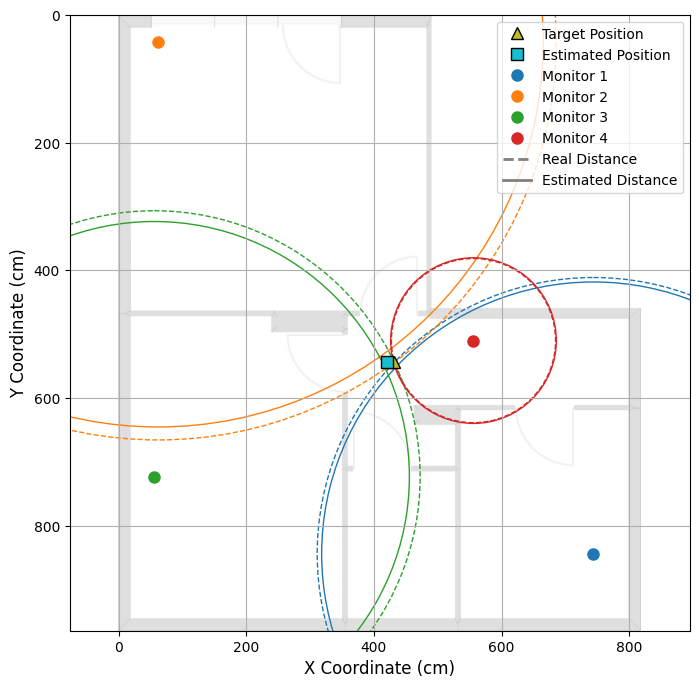

Max error:
     target_mac target_position                           estimation_tls  \
4  20f094118214      (179, 896)  (100.32537977877817, 625.2096750368211)   

   distance_error_tls                   estimation_twcl_dist_3  \
4          281.987759  (103.81432396663655, 694.6879556191901)   

   distance_error_twcl_dist_3                  estimation_twcl_rssi_7  \
4                  214.893986  (81.43859758372456, 696.5370673239432)   

   distance_error_twcl_rssi_7  estimation_fpl  distance_error_fpl  
4                   222.04434  (215.0, 780.0)          121.457812  


C:\Users\nikok\AppData\Local\Temp\ipykernel_8024\657931197.py:24: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(*target_position, 'o', marker='^', markerfacecolor=cmap(8), markeredgecolor='black', label="Target Position")
C:\Users\nikok\AppData\Local\Temp\ipykernel_8024\657931197.py:27: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(*estimated_position, 'o', marker='s', markerfacecolor=cmap(9), markeredgecolor='black', label="Estimated Position")


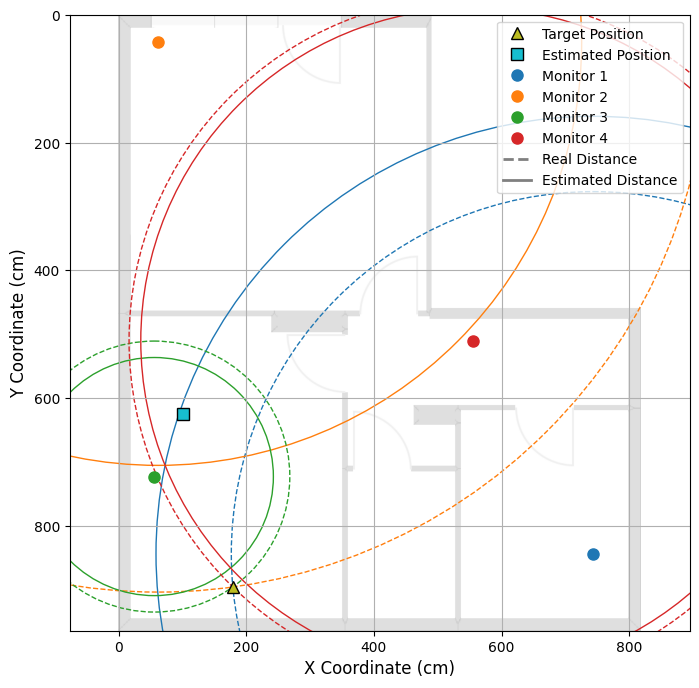

In [102]:
df_estimated_esp8266_row_min_error = df_estimated_esp8266[df_estimated_esp8266["distance_error_tls"] == df_estimated_esp8266["distance_error_tls"].min()]
df_estimated_esp8266_row_max_error = df_estimated_esp8266[df_estimated_esp8266["distance_error_tls"] == df_estimated_esp8266["distance_error_tls"].max()]

df_estimated_esp8266_min = df_eval_ure_esp8266[(df_eval_ure_esp8266["target_mac"] == df_estimated_esp8266_row_min_error["target_mac"].item()) & (df_eval_ure_esp8266["target_position"] == df_estimated_esp8266_row_min_error["target_position"].item())]
df_estimated_esp8266_max = df_eval_ure_esp8266[(df_eval_ure_esp8266["target_mac"] == df_estimated_esp8266_row_max_error["target_mac"].item()) & (df_eval_ure_esp8266["target_position"] == df_estimated_esp8266_row_max_error["target_position"].item())]

print("Min error:")
print(df_estimated_esp8266_row_min_error)
plot_distances(df_estimated_esp8266_min, df_estimated_esp8266_row_min_error["target_position"].item(), df_estimated_esp8266_row_min_error["estimation_tls"].item(), "./images/flat_normalized.png")

print("Max error:")
print(df_estimated_esp8266_row_max_error)
plot_distances(df_estimated_esp8266_max, df_estimated_esp8266_row_max_error["target_position"].item(), df_estimated_esp8266_row_max_error["estimation_tls"].item(), "./images/flat_normalized.png")

In [96]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import get_cmap
from scipy.ndimage import zoom
import matplotlib.pyplot as pp

def plot_heatmap(heatmap, target_position, estimated_position, background_image_path = "./images/apb_3081_scaled_fingerprints.png"):
    # Initialize the plot
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot background image if provided
    if background_image_path:
        img = plt.imread(background_image_path)
        img_height, img_width = img.shape[:2]  # Get the dimensions of the background image
        ax.imshow(img, aspect='auto', alpha=0.5, origin="upper")
        
        # Resize heatmap to match the background image size
        heatmap_resized = zoom(heatmap, (img_height / heatmap.shape[0], img_width / heatmap.shape[1]))
        # Overlay the resized heatmap
        ax.imshow(heatmap_resized, cmap=pp.get_cmap('RdYlBu_r'), alpha=0.6, interpolation='bilinear', origin="upper")

    # Get a colormap
    cmap = get_cmap("tab10")

    # Plot the target position as a green dot
    ax.plot(*target_position, 'o', marker='^', markerfacecolor=cmap(8), markeredgecolor='black', label="Target Position")

    # Plot the target position as a green dot
    ax.plot(*estimated_position, 'o', marker='s', markerfacecolor=cmap(9), markeredgecolor='black', label="Estimated Position")

    # Configure plot appearance
    # ax.set_aspect('equal', adjustable='datalim')
    ax.legend(loc="upper right")
    plt.xlabel("X Coordinate (cm)")
    plt.ylabel("Y Coordinate (cm)")
    # plt.title("Heatmap Visualization")
    plt.grid(True)
    plt.show()

Max error:
      target_mac target_position                          estimation_tls  \
53  d81c79de34e1      (701, 544)  (476.8725140423219, 646.7698750063176)   

    distance_error_tls                  estimation_twcl_dist_3  \
53          246.565969  (556.5194395446665, 598.2002930700827)   

    distance_error_twcl_dist_3                  estimation_twcl_rssi_7  \
53                  154.312359  (533.3667592364756, 568.2113008059223)   

    distance_error_twcl_rssi_7  estimation_fpl  distance_error_fpl  
53                  169.372638  (515.0, 685.0)          233.403085  


C:\Users\nikok\AppData\Local\Temp\ipykernel_8024\1913318079.py:25: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(*target_position, 'o', marker='^', markerfacecolor=cmap(8), markeredgecolor='black', label="Target Position")
C:\Users\nikok\AppData\Local\Temp\ipykernel_8024\1913318079.py:28: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(*estimated_position, 'o', marker='s', markerfacecolor=cmap(9), markeredgecolor='black', label="Estimated Position")


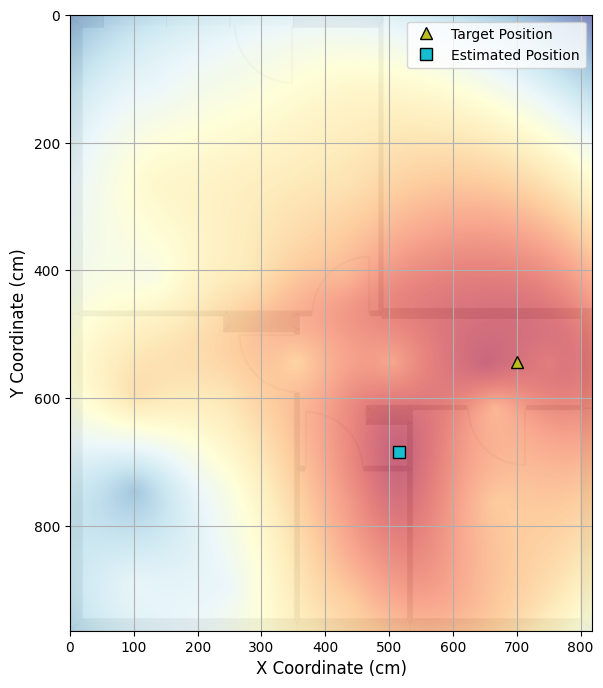

In [100]:
df_estimated_esp8266_row_min_error_fpl = df_estimated_esp8266[df_estimated_esp8266["distance_error_fpl"] == df_estimated_esp8266["distance_error_fpl"].min()]
df_estimated_esp8266_row_max_error_fpl = df_estimated_esp8266[df_estimated_esp8266["distance_error_fpl"] == df_estimated_esp8266["distance_error_fpl"].max()]

df_estimated_esp8266_min_fpl = df_eval_ure_esp8266[(df_eval_ure_esp8266["target_mac"] == df_estimated_esp8266_row_min_error_fpl["target_mac"].item()) & (df_eval_ure_esp8266["target_position"] == df_estimated_esp8266_row_min_error_fpl["target_position"].item())]
df_estimated_esp8266_max_fpl = df_eval_ure_esp8266[(df_eval_ure_esp8266["target_mac"] == df_estimated_esp8266_row_max_error_fpl["target_mac"].item()) & (df_eval_ure_esp8266["target_position"] == df_estimated_esp8266_row_max_error_fpl["target_position"].item())]

esp8266_max_fpl_anchor_rssis = df_estimated_esp8266_max_fpl.set_index('monitor_mac')['rssi'].to_dict()

df_fingerprints_target_mac = df_fingerprint_median[df_fingerprint_median["target_mac"] == df_estimated_esp8266_row_max_error_fpl["target_mac"].unique().item()]
            
esp8266_max_fpl_alg = FingerprintingLocalization(df_fingerprints_target_mac, (819, 965)) # TODO: replace with real size
esp8266_max_estimation_fpl = esp8266_max_fpl_alg.localize(esp8266_max_fpl_anchor_rssis)

print("Max error:")
print(df_estimated_esp8266_row_max_error_fpl)
plot_heatmap(-esp8266_max_estimation_fpl['heatmap'], df_estimated_esp8266_row_max_error_fpl["target_position"].item(), df_estimated_esp8266_row_max_error_fpl["estimation_fpl"].item(), "./images/flat_normalized.png")

Min error:


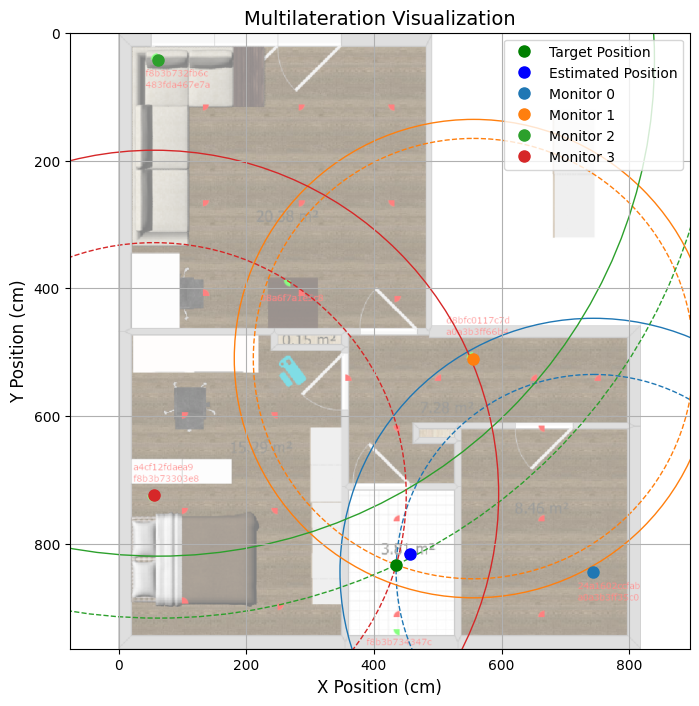

Max error:


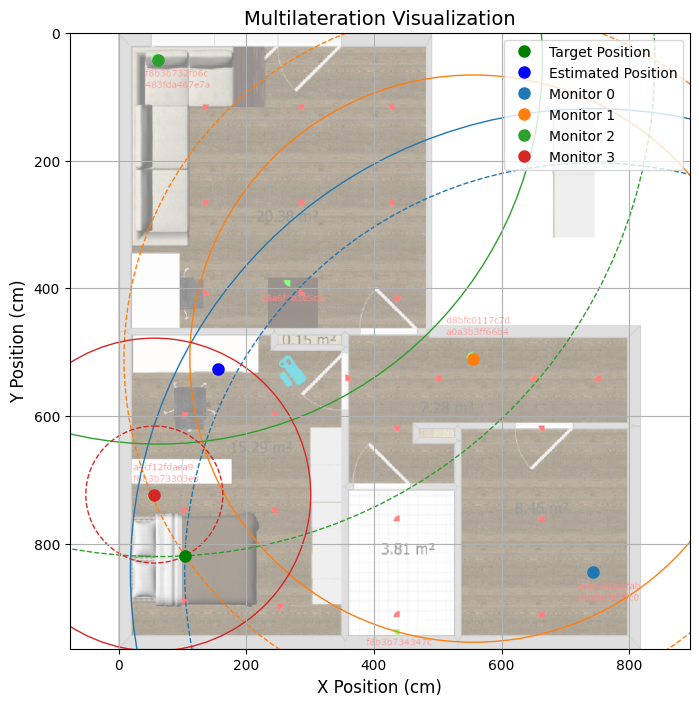

,target_mac,target_position,estimation_tls,distance_error_tls,estimation_twcl_dist_3,distance_error_twcl_dist_3,estimation_twcl_rssi_7,distance_error_twcl_rssi_7,estimation_fpl,distance_error_fpl
1,20f094118214,"(104, 819)","(156.06165487983827, 526.735498708707)",296.865213,"(185.39635425968572, 631.25766991432)",204.62783,"(136.80556815312812, 605.9054529065653)",215.604943,"(230.0, 795.0)",128.26535


In [95]:
df_estimated_esp32_row_min_error = df_estimated_esp32[df_estimated_esp32["distance_error_tls"] == df_estimated_esp32["distance_error_tls"].min()]
df_estimated_esp32_row_max_error = df_estimated_esp32[df_estimated_esp32["distance_error_tls"] == df_estimated_esp32["distance_error_tls"].max()]

df_estimated_esp32_min = df_eval_ure_esp32[(df_eval_ure_esp32["target_mac"] == df_estimated_esp32_row_min_error["target_mac"].item()) & (df_eval_ure_esp32["target_position"] == df_estimated_esp32_row_min_error["target_position"].item())]
df_estimated_esp32_max = df_eval_ure_esp32[(df_eval_ure_esp32["target_mac"] == df_estimated_esp32_row_max_error["target_mac"].item()) & (df_eval_ure_esp32["target_position"] == df_estimated_esp32_row_max_error["target_position"].item())]

print("Min error:")
plot_distances(df_estimated_esp32_min, df_estimated_esp32_row_min_error["target_position"].item(), df_estimated_esp32_row_min_error["estimation_tls"].item(), "./images/flat_scaled_fingerprints.png")
print("Max error:")
plot_distances(df_estimated_esp32_max, df_estimated_esp32_row_max_error["target_position"].item(), df_estimated_esp32_row_max_error["estimation_tls"].item(), "./images/flat_scaled_fingerprints.png")
df_estimated_esp32_row_max_error

In [96]:
df_eval_ure_esp32[(df_eval_ure_esp32["target_position"] == (1334, 180)) & (df_eval_ure_esp32["target_mac"] == '20f094118214') & (df_eval_ure_esp32["monitor_mac"] == 'a0a3b3ff66b4')]

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size,class,distance,rssi_0,n,estimated_distance,ure


In [97]:
df_eval_ure_esp32[df_eval_ure_esp32["index"] == 116]

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size,class,distance,rssi_0,n,estimated_distance,ure


In [98]:
new_rssi = -88
rssi_0_value = df_eval_ure_esp32[df_eval_ure_esp32["index"] == 116]["rssi_0"].item()
n_value = df_eval_ure_esp32[df_eval_ure_esp32["index"] == 116]["n"].item()
new_distance_value = inverse_path_loss_model(new_rssi, rssi_0_value, n_value)
tmp = df_eval_ure_esp32.assign(rssi=df_eval_ure_esp32["rssi"].where(df_eval_ure_esp32.index != 116, new_rssi))
tmp = tmp.assign(estimated_distance=tmp["estimated_distance"].where(tmp.index != 116, new_distance_value))
tmp[tmp["index"] == 116]

ValueError: can only convert an array of size 1 to a Python scalar

In [32]:
tmp_estimatd_esp32 = estimate_positions(tmp).sort_values("distance_error_tls")
tmp_estimated_position = tmp_estimatd_esp32[(tmp_estimatd_esp32["target_mac"] == df_estimated_esp32_row_max_error["target_mac"].item()) & (tmp_estimatd_esp32["target_position"] == df_estimated_esp32_row_max_error["target_position"].item())]["estimation_tls"].item()

tmp_esp32_max = tmp[(tmp["target_mac"] == df_estimated_esp32_row_max_error["target_mac"].item()) & (tmp["target_position"] == df_estimated_esp32_row_max_error["target_position"].item())]

print("Max error:")
plot_distances(tmp_esp32_max, df_estimated_esp32_row_max_error["target_position"].item(), tmp_estimated_position)
tmp_estimatd_esp32

NameError: name 'tmp' is not defined

- numerical instability because of very large values in the matrices
- outlier appears very far away
- only values from 3 (instead of 4) monitors → no redundancy → error has large impact

### Error visualization for twcl:

Min error:


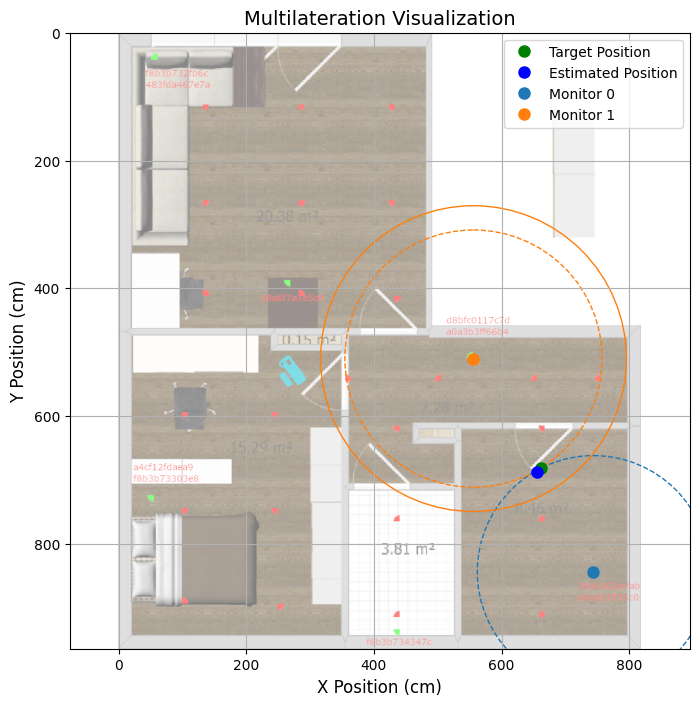

Max error:


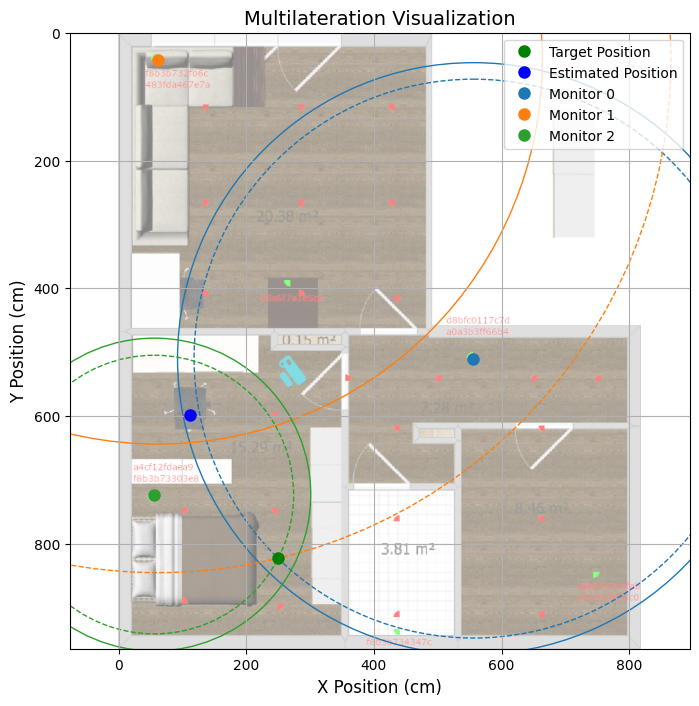

,target_mac,target_position,estimation_tls,distance_error_tls,estimation_twcl_dist_3,distance_error_twcl_dist_3,estimation_twcl_rssi_7,distance_error_twcl_rssi_7,estimation_fpl,distance_error_fpl
8,20f094118214,"(250, 823)","(183.26346003534235, 545.4892170951907)",285.422495,"(156.0671671882401, 625.0408193550112)",219.114614,"(111.5580841183166, 598.9762046544955)",263.349245,"(165.0, 850.0)",89.185201


In [99]:
df_estimated_esp32_row_min_error_twcl = df_estimated_esp32[df_estimated_esp32["distance_error_twcl_rssi_7"] == df_estimated_esp32["distance_error_twcl_rssi_7"].min()]
df_estimated_esp32_row_max_error_twcl = df_estimated_esp32[df_estimated_esp32["distance_error_twcl_rssi_7"] == df_estimated_esp32["distance_error_twcl_rssi_7"].max()]

df_estimated_esp32_min_twcl = df_eval_ure_esp32[(df_eval_ure_esp32["target_mac"] == df_estimated_esp32_row_min_error_twcl["target_mac"].item()) & (df_eval_ure_esp32["target_position"] == df_estimated_esp32_row_min_error_twcl["target_position"].item())]
df_estimated_esp32_max_twcl = df_eval_ure_esp32[(df_eval_ure_esp32["target_mac"] == df_estimated_esp32_row_max_error_twcl["target_mac"].item()) & (df_eval_ure_esp32["target_position"] == df_estimated_esp32_row_max_error_twcl["target_position"].item())]

print("Min error:")
plot_distances(df_estimated_esp32_min_twcl, df_estimated_esp32_row_min_error_twcl["target_position"].item(), df_estimated_esp32_row_min_error_twcl["estimation_twcl_rssi_7"].item(), "./images/flat_scaled_fingerprints.png")
print("Max error:")
plot_distances(df_estimated_esp32_max_twcl, df_estimated_esp32_row_max_error_twcl["target_position"].item(), df_estimated_esp32_row_max_error_twcl["estimation_twcl_rssi_7"].item(), "./images/flat_scaled_fingerprints.png")
df_estimated_esp32_row_max_error_twcl

In [100]:
df_fingerprint_median

,index,target_position,target_mac,monitor_mac,anchor_position,rssi,group_size
0,1,"(100, 595)",20f094118214,24a1602ccfab,"(744, 844)",-78.0,215
1,2,"(100, 595)",20f094118214,483fda467e7a,"(62, 42)",-75.0,88
2,3,"(100, 595)",20f094118214,a0a3b3ff35c0,"(744, 844)",-83.0,32
3,4,"(100, 595)",20f094118214,a0a3b3ff66b4,"(556, 510)",-68.0,165
4,5,"(100, 595)",20f094118214,a4cf12fdaea9,"(56, 723)",-51.0,759
...,...,...,...,...,...,...,...
420,236,"(753, 544)",d81c79de34e1,24a1602ccfab,"(744, 844)",-59.0,369
421,237,"(753, 544)",d81c79de34e1,483fda467e7a,"(62, 42)",-70.0,547
422,239,"(753, 544)",d81c79de34e1,a0a3b3ff66b4,"(556, 510)",-51.0,27
423,240,"(753, 544)",d81c79de34e1,a4cf12fdaea9,"(56, 723)",-67.0,1144


In [130]:
from matplotlib.ticker import AutoMinorLocator

def plot_localization_error(df, group_name):
    # Calculate the mean error per target device for each algorithm
    agg_df = df.groupby('target_mac')[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].apply(rmse).reset_index()

    # Define algorithms and their corresponding distance error columns
    algorithms = ['tls', 'twcl_dist_3', 'twcl_rssi_7', 'fpl']
    distance_error_cols = [f'distance_error_{algo}' for algo in algorithms]

    # Custom mappings for friendly names
    friendly_names_algo = {
        'tls': 'LST',
        'twcl_dist_3': 'WCL (Distance)',
        'twcl_rssi_7': 'WCL (RSSI)',
        'fpl': 'FP',
    }

    # Apply friendly names for the x-axis labels
    agg_df['friendly_name'] = agg_df['target_mac'].map(device_names)

    # Plot setup
    group_spacing = 0.5  # Space between groups
    bar_spacing = 0.05   # Space between bars within a group
    width = 0.15         # Narrower bar width
    x = np.arange(len(agg_df)) * (len(algorithms) * (width + bar_spacing) + group_spacing)

    fig, ax = plt.subplots(figsize=(12, 5))

    # Plot each algorithm's bars
    for i, algo in enumerate(algorithms):
        bar_positions = x + i * (width + bar_spacing)
        ax.bar(
            bar_positions,
            agg_df[f'distance_error_{algo}'] / 100.0,
            width,
            label=friendly_names_algo[algo]
        )

    # Add labels, title, and legend
    ax.set_xlabel('Target Devices', fontsize=12)
    ax.set_ylabel('RMSE User Accuracy (m)', fontsize=12)
    # ax.set_title(f'RMSE User Accuracy using {group_name}', fontsize=14)
    ax.set_xticks(x + (len(algorithms) - 1) * (width + bar_spacing) / 2)
    ax.set_xticklabels(agg_df['friendly_name'])
    ax.legend(title='Algorithm')

    # Move the legend to the right
    # ax.legend(title='Algorithm', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Enable grid
    ax.grid(True, which='major', axis='y', linestyle=':', linewidth=1.5, alpha=0.8)  # Thicker, solid lines for major ticks
    ax.yaxis.set_minor_locator(AutoMinorLocator(2))
    ax.grid(True, which='minor', axis='y', linestyle=':', linewidth=1.0, alpha=0.8)
    ax.set_axisbelow(True)  # Place grid lines below the bars

    # ax.set_ylim(0, 2.1)
    # ax.set_yscale('log')

    # Display the plot
    plt.tight_layout()
    plt.show()

All:


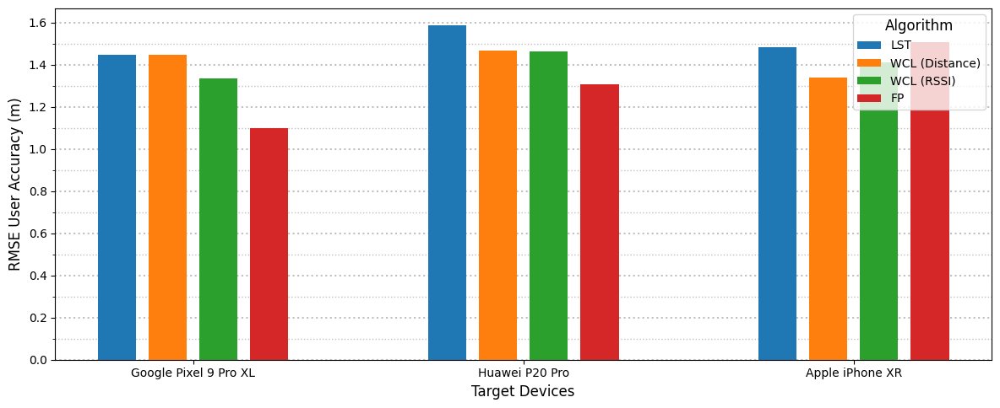

ESP8266:


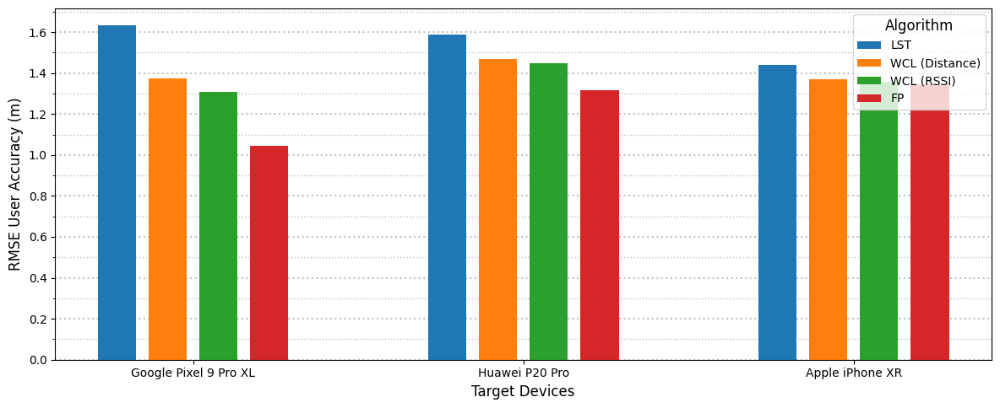

ESP32:


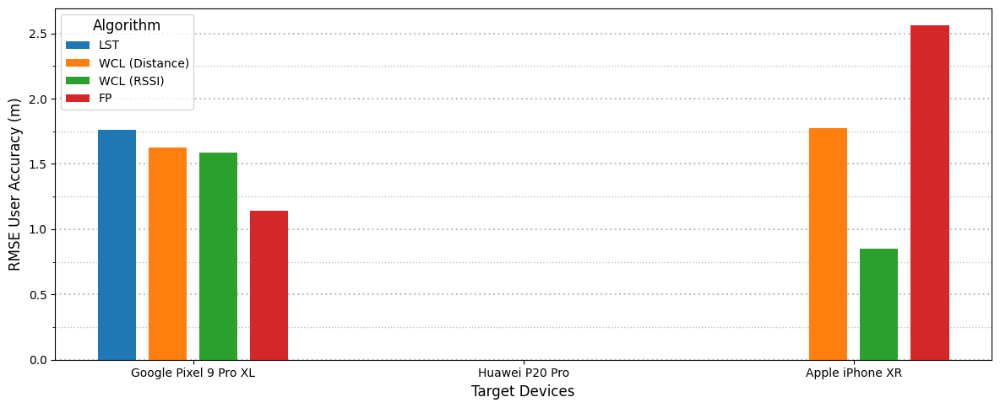

In [131]:
print("All:")
plot_localization_error(df_estimated_all, 'all monitors')
print("ESP8266:")
plot_localization_error(df_estimated_esp8266, 'only ESP8266')
print("ESP32:")
plot_localization_error(df_estimated_esp32, 'only ESP32')

In [133]:
print("ESP8266:")
df_estimated_esp8266.groupby('target_mac')[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].apply(rmse).reset_index()

ESP8266:


,target_mac,distance_error_tls,distance_error_twcl_dist_3,distance_error_twcl_rssi_7,distance_error_fpl
0,20f094118214,163.395797,137.495874,131.011981,104.268883
1,342eb61ec446,158.722091,146.662967,144.744468,131.734160
2,d81c79de34e1,143.931847,137.167700,135.656420,134.524678


In [136]:
df_estimated_esp8266.groupby('target_mac')[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].apply(rmse).reset_index()[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].mean(axis=1)

0    134.043134
1    145.465921
2    137.820161
dtype: float64

In [134]:
print("ESP32:")
df_estimated_esp32.groupby('target_mac')[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].apply(rmse).reset_index()

ESP32:


,target_mac,distance_error_tls,distance_error_twcl_dist_3,distance_error_twcl_rssi_7,distance_error_fpl
0,20f094118214,175.928088,162.454850,158.530762,114.194279
1,342eb61ec446,NaN,NaN,NaN,NaN
2,d81c79de34e1,NaN,177.186343,84.781337,256.326940


In [1]:
df_estimated_esp32.groupby('target_mac')[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].apply(rmse).reset_index()[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].mean(axis=1)

NameError: name 'df_estimated_esp32' is not defined

In [120]:
user_accuracy_relevant_columns = ['estimation_tls', 'estimation_twcl_dist_3', 'estimation_twcl_rssi_7', 'estimation_fpl']

print("ESP8266 Sample Size:")
get_sample_sizes(df_estimated_esp8266, user_accuracy_relevant_columns)

ESP8266 Sample Size:


,estimation_tls,estimation_twcl_dist_3,estimation_twcl_rssi_7,estimation_fpl
target_mac,,,,
20f094118214,18,18,18,18
342eb61ec446,18,18,18,18
d81c79de34e1,18,18,18,18


In [121]:
print("ESP32 Sample Size:")
get_sample_sizes(df_estimated_esp32, user_accuracy_relevant_columns)

ESP32 Sample Size:


,estimation_tls,estimation_twcl_dist_3,estimation_twcl_rssi_7,estimation_fpl
target_mac,,,,
20f094118214,18,18,18,18
342eb61ec446,0,0,0,0
d81c79de34e1,0,2,2,2


In [137]:
def save_results(df, filepath):
    df.groupby('target_mac')[["distance_error_tls", "distance_error_twcl_dist_3", "distance_error_twcl_rssi_7", "distance_error_fpl"]].apply(rmse).reset_index().to_csv(filepath, index=False)

In [140]:
save_results(df_estimated_esp8266, "./data/filtered/flat/results/esp8266_filtered.csv")
save_results(df_estimated_esp32, "./data/filtered/flat/results/esp32_filtered.csv")

In [311]:
from matplotlib.colors import to_rgb
from colorsys import rgb_to_hls, hls_to_rgb
from matplotlib.ticker import AutoMinorLocator
import matplotlib.pyplot as plt
import numpy as np

def lighten_color(color, factor=0.3):
    """
    Lightens the given color by multiplying (1 - factor) to the lightness in HLS space.
    :param color: The original color as an RGB tuple or string.
    :param factor: The lightening factor (0.0 = no change, 1.0 = completely white).
    :return: The lightened color as an RGB tuple.
    """
    rgb = to_rgb(color)  # Convert to RGB
    h, l, s = rgb_to_hls(*rgb)  # Convert RGB to HLS
    l = min(1.0, l + factor * (1.0 - l))  # Lighten the lightness
    return hls_to_rgb(h, l, s)  # Convert back to RGB

def plot_localization_error_both(df_filtered, df_unfiltered):
    # Define algorithms and their corresponding distance error columns
    algorithms = ['tls', 'twcl_dist_3', 'twcl_rssi_7', 'fpl']

    # Custom mappings for friendly names
    friendly_names_algo = {
        'tls': 'LST',
        'twcl_dist_3': 'WCL (Distance)',
        'twcl_rssi_7': 'WCL (RSSI)',
        'fpl': 'FP',
    }

    # Apply friendly names for the x-axis labels
    df_unfiltered['friendly_name'] = df_unfiltered['target_mac'].map(device_names)
    df_filtered['friendly_name'] = df_filtered['target_mac'].map(device_names)

    # Plot setup
    group_spacing = 0.5  # Space between groups
    bar_spacing = 0.05   # Space between bars within a group
    width = 0.15         # Narrower bar width
    x = np.arange(len(df_filtered)) * (len(algorithms) * (width + bar_spacing) + group_spacing)

    fig, ax = plt.subplots(figsize=(12, 5))

    # Get default colormap
    cmap = plt.cm.get_cmap('tab10')

    # Plot bars for each algorithm
    for i, algo in enumerate(algorithms):
        for j, pos in enumerate(x):
            unfiltered_value = df_unfiltered[f'distance_error_{algo}'].iloc[j] / 100.0
            filtered_value = df_filtered[f'distance_error_{algo}'].iloc[j] / 100.0

            color = cmap(i)
            lightened_color = lighten_color(color, factor=0.5)

            # Plot horizontal line for unprocessed data
            ax.hlines(
                unfiltered_value,
                pos + i * (width + bar_spacing) - (width / 2) * 0.75,
                pos + i * (width + bar_spacing) + (width / 2) * 0.75,
                colors=lightened_color,
                linestyles=(0, (1.5, 0.5)),  # Dashed line style
                linewidth=5,
                label=f'{friendly_names_algo[algo]} - unfiltered' if j == 0 else None,  # Avoid duplicate legend entries
            )

            # Plot preprocessed data as bars (solid fill)
            ax.bar(
                pos + i * (width + bar_spacing),
                filtered_value,
                width,
                color=color,  # Use colormap for the fill color
                label=f'{friendly_names_algo[algo]}' if j == 0 else None,  # Avoid duplicate legend entries
            )

    # Add labels, title, and legend
    ax.set_xlabel('Target Devices', fontsize=12)
    ax.set_ylabel('RMSE User Accuracy (m)', fontsize=12)
    # ax.set_title('RMSE User Accuracy Comparison (Filtered vs. Unfiltered)', fontsize=14)

    # Center x-axis ticks between the groups
    ax.set_xticks(x + (len(algorithms) - 1) * (width + bar_spacing) / 2)
    ax.set_xticklabels(df_filtered['friendly_name'])

    # Legend
    ax.legend(title='Algorithm', bbox_to_anchor=(1.01, 1), loc='upper left')

    # Grid and formatting
    ax.grid(True, which='major', axis='y', linestyle=':', linewidth=1.5, alpha=0.8)
    ax.yaxis.set_minor_locator(AutoMinorLocator(2))
    ax.grid(True, which='minor', axis='y', linestyle=':', linewidth=1.0, alpha=0.8)
    ax.set_axisbelow(True)

    # Final adjustments
    plt.tight_layout()
    plt.show()


ESP8266:


C:\Users\nikok\AppData\Local\Temp\ipykernel_56260\4208404669.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10')


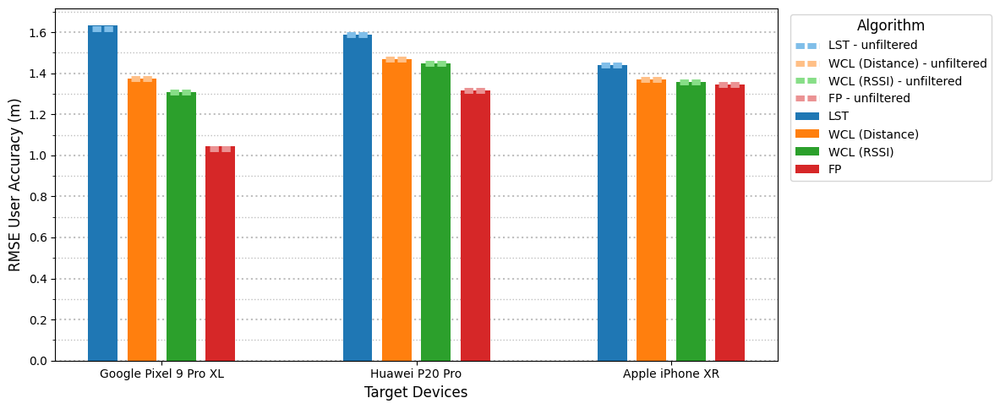

ESP32:


C:\Users\nikok\AppData\Local\Temp\ipykernel_56260\4208404669.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10')


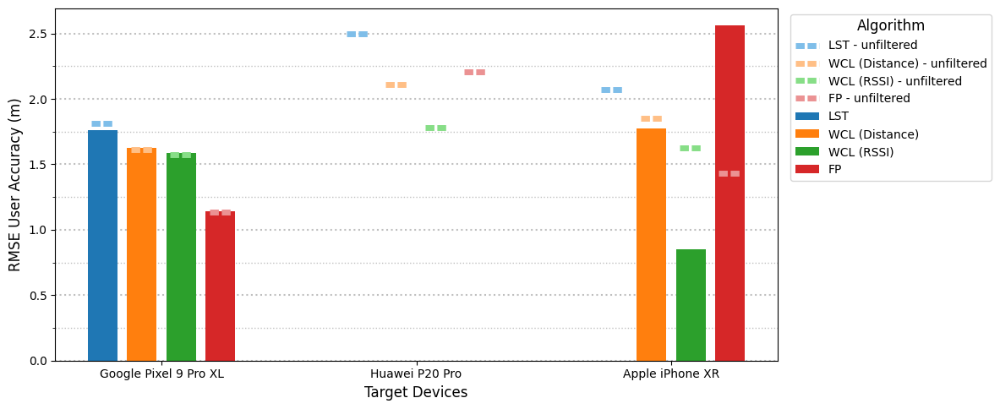

In [314]:
print("ESP8266:")
plot_localization_error_both(pd.read_csv("./data/filtered/flat/results/esp8266_filtered.csv"), pd.read_csv("./data/filtered/flat/results/esp8266_unfiltered.csv"))

print("ESP32:")
plot_localization_error_both(pd.read_csv("./data/filtered/flat/results/esp32_filtered.csv"), pd.read_csv("./data/filtered/flat/results/esp32_unfiltered.csv"))

In [105]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import get_cmap

def plot_localizations(df1, df2, df3, background_image_path):
    """
    Plots the target position and estimated positions from multiple algorithms for multiple target devices
    across three hardware configurations.
    
    Parameters:
        df1, df2, df3 (pandas.DataFrame): DataFrames containing localization data for different hardware configurations.
        background_image_filepath (str): Filepath to the background image for plotting.
    """
    # Load the background image
    if background_image_path:
        img = plt.imread(background_image_path)
        # ax.imshow(img, aspect='auto', alpha=0.5)
    
    # List of algorithms to plot
    algorithms = ['estimation_tls', 'estimation_tls_median', 
                  'estimation_twcl_dist_2', 'estimation_twcl_rssi_8', 'estimation_fpl']
    
    # Combine all dataframes into a list for easier processing
    dfs = [df1, df2, df3]
    
    # Get unique target positions
    target_positions = df1['target_position'].unique()
    
    # Set up the figure dimensions
    num_positions = len(target_positions)
    
    for i, target_position in enumerate(target_positions):
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        for j, df in enumerate(dfs):
            ax = axes[j]
            
            # Filter data for the current target position
            df_filtered = df[df['target_position'] == target_position]
            
            # Plot the background image
            ax.imshow(img, aspect='auto', alpha=0.5)
            
            # Plot the target position as a red marker
            for _, row in df_filtered.iterrows():
                target_mac = row['target_mac']
                x, y = row['target_position']
                ax.scatter(x, y, color='red', label=f'Target ({target_mac})', zorder=2)
                
                # Plot the estimated positions for each algorithm
                for algo in algorithms:
                    if algo in row and row[algo] is not None:
                        if row[algo] is None:
                            continue
                        
                        est_x, est_y = row[algo]
                        ax.scatter(est_x, est_y, label=f'{algo} ({target_mac})', zorder=3)
            
            # Set axis labels and title
            ax.set_title(f'Hardware Config {j + 1} - Target Position {target_position}', fontsize=14)
            ax.set_xlabel('X Coordinate')
            ax.set_ylabel('Y Coordinate')
            ax.legend(loc='upper right', fontsize=8)
            ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    
        # Adjust layout for better spacing
        plt.tight_layout()
        plt.show()

In [106]:
#df_estimated_esp8266['hardware'] = 'esp8266'
#df_estimated_esp32['hardware'] = 'esp32'
#df_estimated_all['hardware'] = 'all'

#df_estimated_combined = pd.concat([df_estimated_esp8266, df_estimated_esp32, df_estimated_all])
#preprocess_target_positions(df_estimated_combined)['target_position'].unique()
df_estimated_esp8266['target_position'].unique()

array([(432, 544), (435, 833), (663, 681), (361, 335), (701, 544),
       (181, 747), (179, 747), (661, 682), (437, 682), (212, 331),
       (363, 188), (250, 657), (171, 596), (582, 544), (663, 835),
       (104, 819), (101, 657), (212, 188), (104, 657), (217, 188),
       (179, 896), (250, 823), (212, 335), (701, 542), (249, 657)],
      dtype=object)

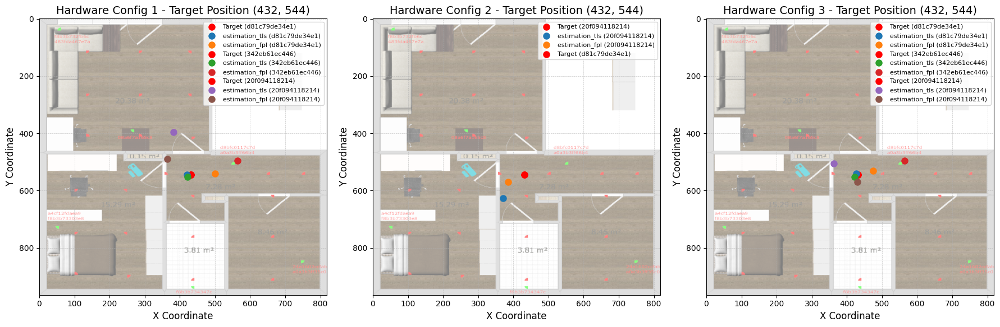

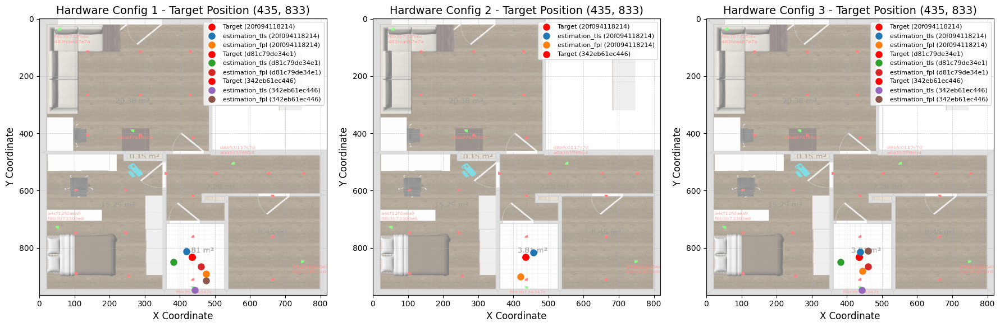

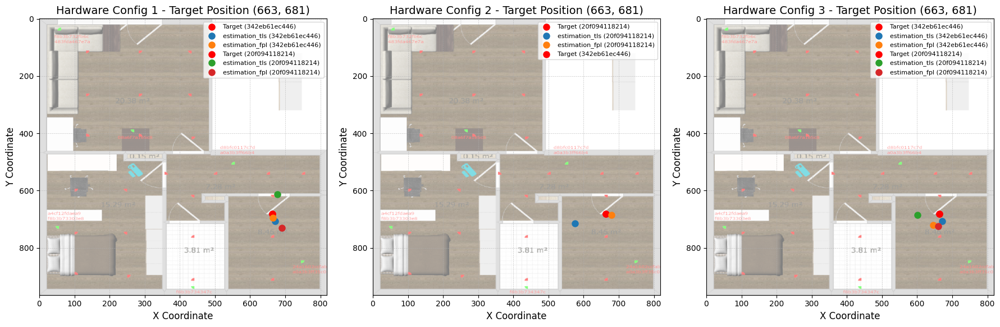

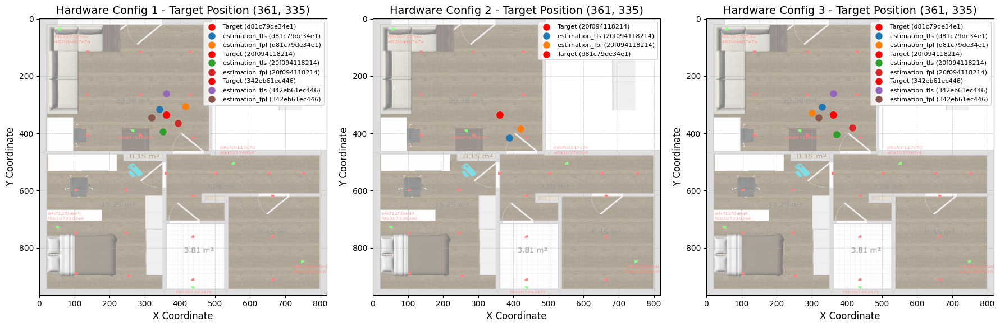

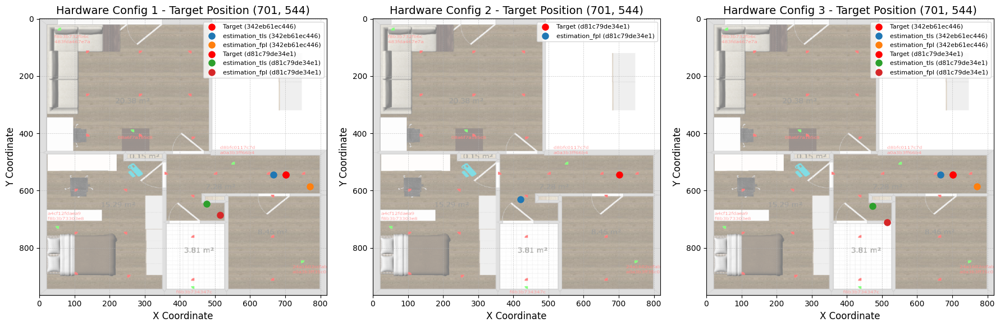

C:\Users\nikok\AppData\Local\Temp\ipykernel_22928\163199963.py:62: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', fontsize=8)


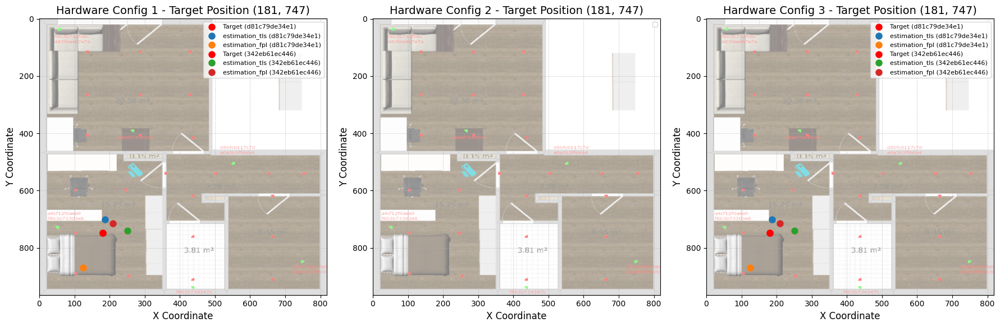

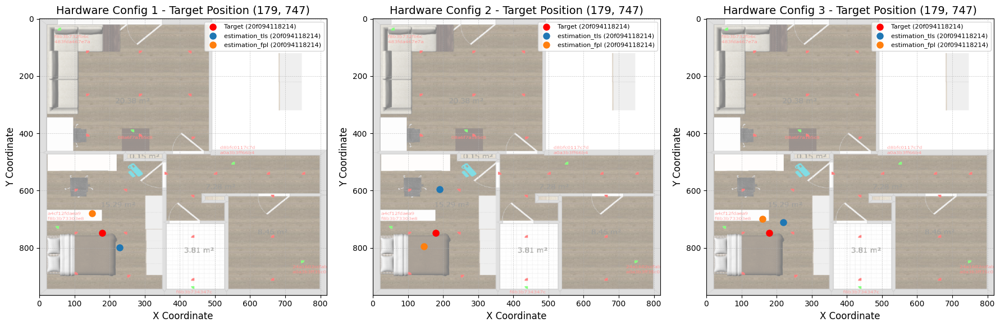

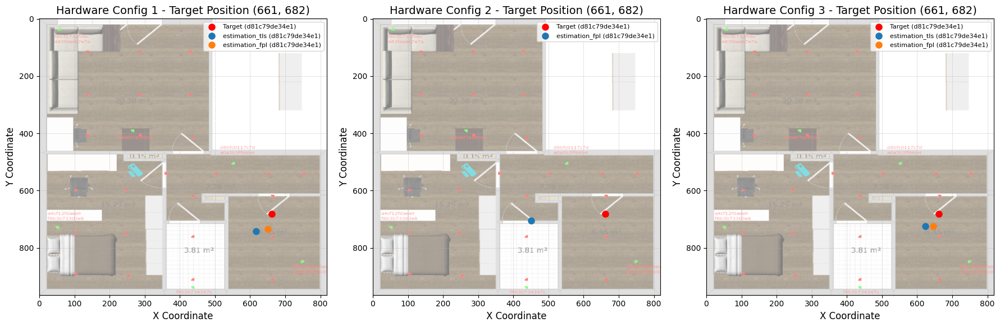

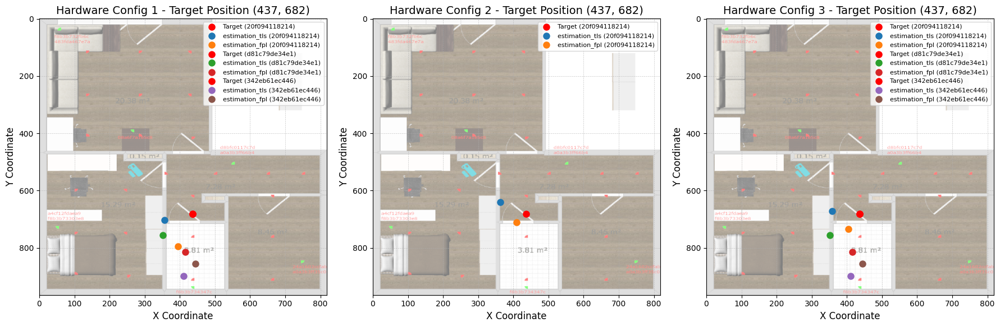

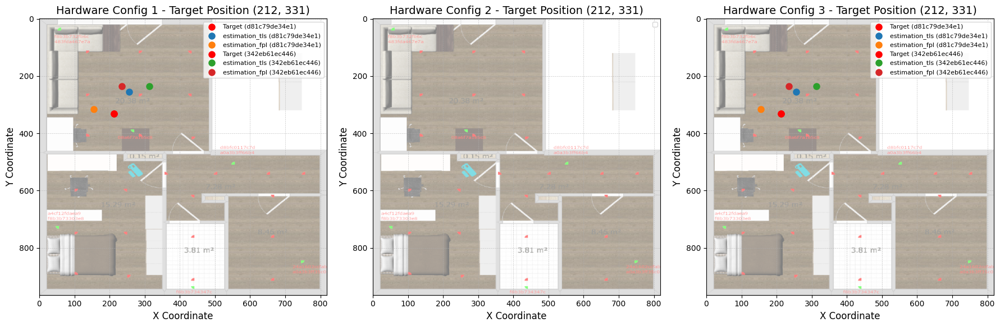

...

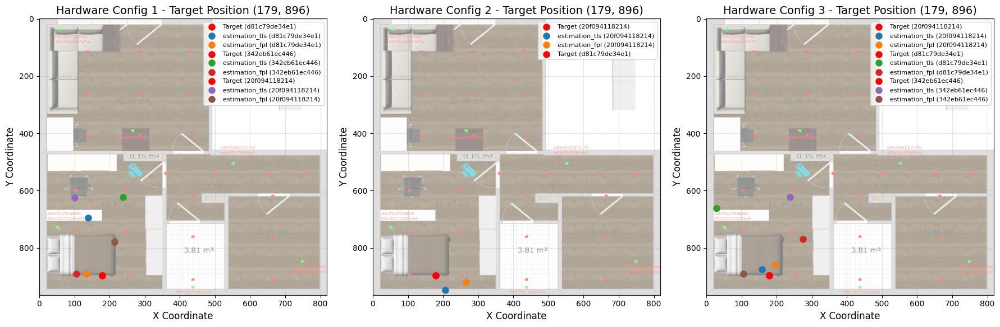

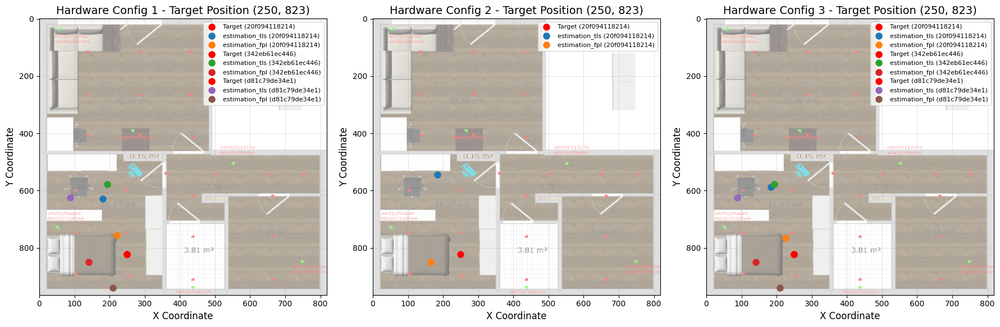

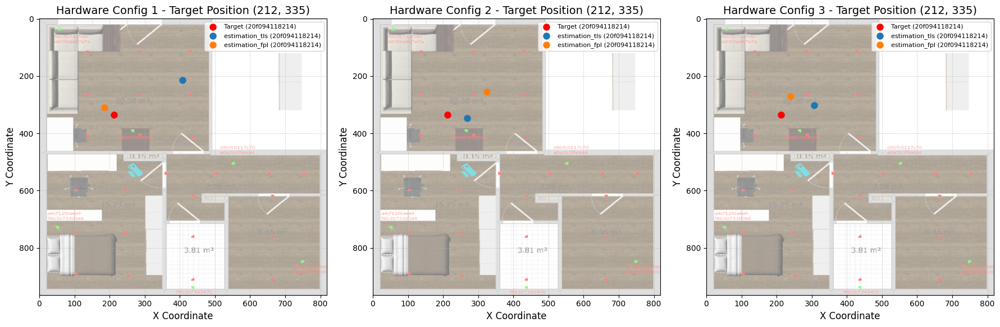

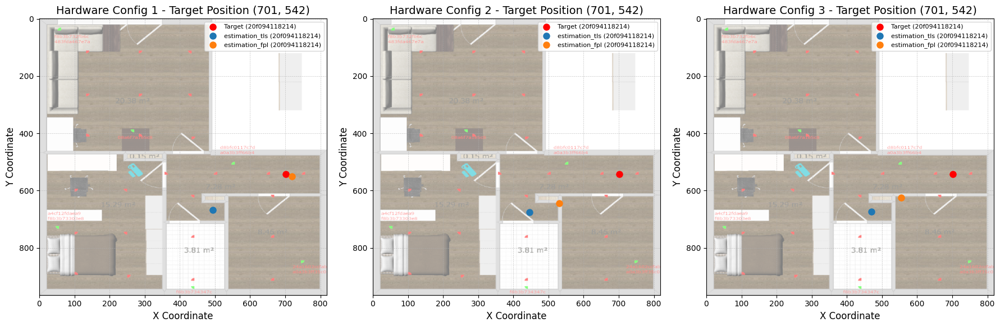

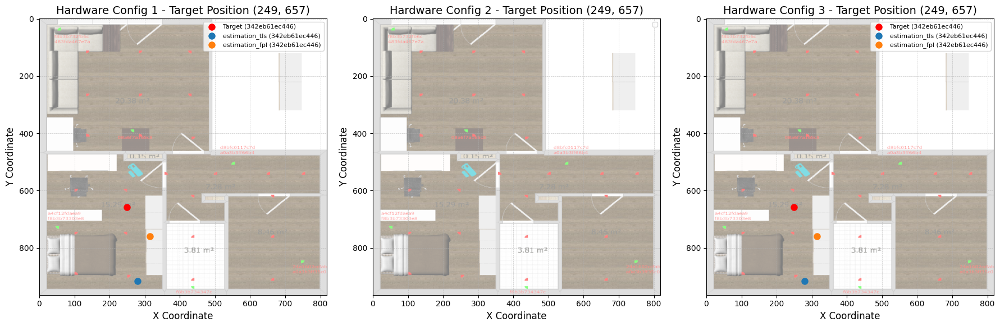

In [107]:
plot_localizations(df_estimated_esp8266, df_estimated_esp32, df_estimated_all, "./images/flat_scaled_fingerprints.png")